# COVID 19: 'Out-of-the-box' view points

# Project Overview

This project focuses on comparing some overlooked parameters and metrics that changed for good during the pandemic. This project specifically focuses on
1. Gaming trend
2. Flight travel and carbon emissions
3. Suicide rate in the United States of America
4. Climate change across the globe

# Potential Research Questions?

1. Do trends in the COVID data have correlations to aspects of the world like Flights Traffic, Climate, Gaming that could've been overlooked by media?
2. Can COVID data be correlated to the trends in Suicide data? If so, did it impact differently for different age groups?
3. What role did video games play during the pandemic? 
4. Do the trends in flight traffic from U.S. to other countries during COVID tell us something new? Is the flight traffic reduction directly correlated to the trend in the COVID cases for that country?
5. Did the restrictions posed by COVID help combat climate issue? If so, how does the trend look like for different countries?

# Overview of issues found in the data?
## How did we tackle it?

1. COVID dataset:
- COVID count isn't highly reliable because not everyone are getting tested.
- COVID count and vaccination data weren't reported on the same dates

2. Suicide Dataset: 
- There is no authorised data source that authenticates global suicide rate.
- Few false positives and negatives in the dataset. Few natural death and accidents are reported as suicide and vice versa.

3. Gaming Dataset: 
- The twitch global data is not country specific which makes it harder to compare increase in gaming country-wise
- The data also does not mention what sort of games were analyzed which makes it hard for us to compare gaming in multiplayer games and single player games.

4. Flight Traffic Dataset: 
- Flight departurure information at a country and city level was available only till March of 2020. There are datasets available for recent dates, but lacks granular level information. 
- Hence, we had to perform tradeoff between timeline and granularity.

5. Climate Dataset:
- The data source has aggregated the climate data from multiple meteorological sources. There does not seem to be a standard format that need to be followed (example: some countries use MEP AQI while others use AQI).
- Also not all the data sources report all the metrics. 
- We tackle this by ignoring sources which are not reporting metrics that we are interested in.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
cd IDS\ Project\ Fall\ 2021

/content/drive/MyDrive/IDS Project Fall 2021


In [ ]:
!pip install pandas_profiling==2.7.1

In [ ]:
# Required libraries
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import pandas_profiling as pp

### Section 1: COVID Reference data

Global active cases


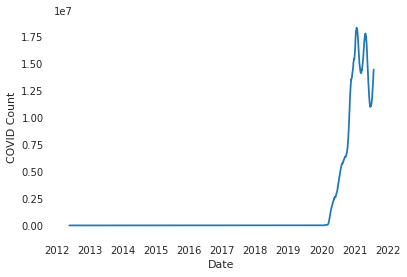

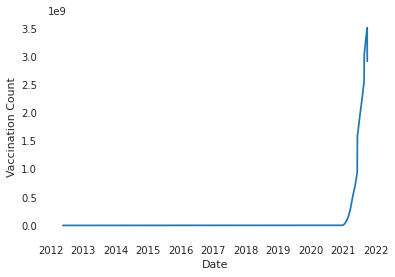

US active cases


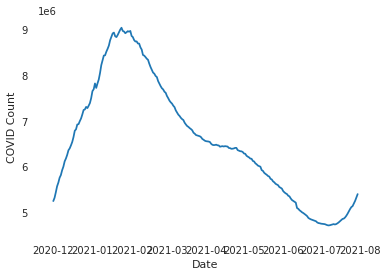

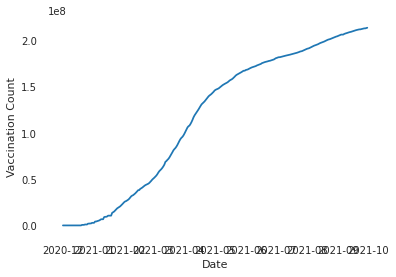

In [ ]:
# 1. COVID Reference data
# Reading the global file
df_covid_global = pd.read_csv("Dataset/covid_global.csv")
df_covid_country = pd.read_csv("Dataset/covid_country_wise.csv")

# Changing the columns to datetime
df_covid_global['date'] = pd.to_datetime(df_covid_global['date'], format='%d/%m/%y')
df_covid_country['date'] = pd.to_datetime(df_covid_country['date'], format='%d/%m/%y')

# Plotting the global data
print ("Global active cases")
plt.plot(df_covid_global['date'], df_covid_global['active_cases'])
plt.xlabel("Date")
plt.ylabel("COVID Count")
plt.show()
plt.plot(df_covid_global['date'], df_covid_global['people_vaccinated'])
plt.xlabel("Date")
plt.ylabel("Vaccination Count")
plt.show()

# Plotting only the USA data
print ("US active cases")
df_covid_usa = df_covid_country[df_covid_country['country'] == 'United States']
plt.plot(df_covid_usa['date'], df_covid_usa['active_cases'])
plt.xlabel("Date")
plt.ylabel("COVID Count")
plt.show()
plt.plot(df_covid_usa['date'], df_covid_usa['people_vaccinated'])
plt.xlabel("Date")
plt.ylabel("Vaccination Count")
plt.show()

### Overview results
1. Global COVID data -> COVID active cases started spiking from 2020 and the growth in exponential with some decrement and unstability at the end
2. GLOBAL COVID data -> COVID vaccination count raise exponentially in the late 2020 and 2021.
3. US COVID data -> Started seeing active cases from 2020 Jan 22. The count increased at a high pace initailly then gradually reduced
4. US COVID data -> COVID vaccination count raise linearly from 2020 Jan to till date.

# New Section
# Section 2: VIDEO GAMING DATA
# Reading the global twitch data dataset

In [ ]:
# Section2 - GAMING
# reading the data
df=pd.read_csv("Dataset/Twitch_global_data.csv")

In [ ]:
# describing the dataset
df.describe()

,year,Month,Hours_watched,Avg_viewers,Peak_viewers,Streams,Avg_channels
count,69.000000,69.000000,6.900000e+01,6.900000e+01,6.900000e+01,6.900000e+01,69.000000
mean,2018.391304,6.304348,1.004935e+09,1.376574e+06,2.887339e+06,1.376553e+07,52983.362319
std,1.673473,3.414090,5.694552e+08,7.779827e+05,1.507786e+06,5.598601e+06,33054.127341
min,2016.000000,1.000000,3.628332e+08,5.046350e+05,1.186009e+06,5.507554e+06,16592.000000
25%,2017.000000,3.000000,5.334504e+08,7.446880e+05,1.735587e+06,8.053586e+06,24219.000000
50%,2018.000000,6.000000,8.558606e+08,1.151898e+06,2.400513e+06,1.388843e+07,45185.000000
75%,2020.000000,9.000000,1.572596e+09,2.116548e+06,3.929074e+06,1.781492e+07,91978.000000
max,2021.000000,12.000000,2.308295e+09,3.106723e+06,6.516666e+06,2.561421e+07,122763.000000


In [ ]:
# we have data from 2016 to 2021 september
df[df["year"]==2021]

,year,Month,Hours_watched,Avg_viewers,Peak_viewers,Streams,Avg_channels,Games_streamed
60,2021,1,2173794168,2925698,6516666,25614207,119448,"34,551"
61,2021,2,1979581961,2950196,5274617,24319608,122763,"34,594"
62,2021,3,2173794168,2925698,6516666,25614207,119448,"34,551"
63,2021,4,2173794168,2925698,6516666,25614207,119448,"34,551"
64,2021,5,2308295297,3106723,5835026,22761038,110484,"36,960"
65,2021,6,1963630266,2731057,5746730,20285356,101892,"36,099"
66,2021,7,1953900874,2629745,4396750,21055358,101755,"36,319"
67,2021,8,1974586275,2657585,4778502,20767741,100701,"36,471"
68,2021,9,1857514531,2583469,5599210,18826493,95513,"35,861"


### Visualizing the trends of various columns of the dataset with respect to the month-year

#### Plotitng Hours watched in millions Vs Year

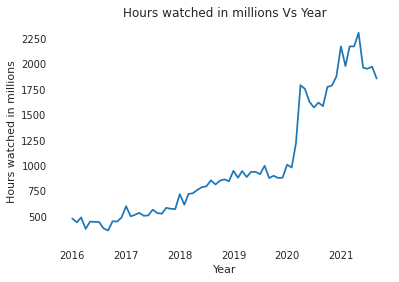

In [ ]:
%matplotlib inline
# concatenating year and month columns into month-year column
df["month-year"]=df["Month"].astype(str)+"-"+df["year"].astype(str)
# converting the string month-year to datetime
df["month-year"]=pd.to_datetime(df["month-year"])
# finding number of millions of hours watched and storing this data in column Hours_watched_millions
df["Hours_watched_millions"]=df["Hours_watched"]/1000000
# plotting the Hours_watched_millions data Vs month-year
plt.plot(df['month-year'], df['Hours_watched_millions'])
plt.xlabel("Year")
plt.ylabel("Hours watched in millions")
plt.title("Hours watched in millions Vs Year")
plt.show()

#### Plotitng Average number of viewers in thousands Vs Year

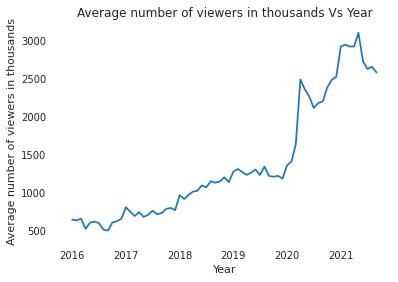

In [ ]:
# converting the string month-year to datetime
df["month-year"]=pd.to_datetime(df["month-year"])
# finding number of average viewers in thousands and storing this data in column Avg_viewers_thousands
df["Avg_viewers_thousands"]=df["Avg_viewers"]/1000
# plotting the Avg_viewers_thousands data Vs month-year
plt.plot(df["month-year"],df["Avg_viewers_thousands"])
plt.xlabel("Year")
plt.ylabel("Average number of viewers in thousands")
plt.title("Average number of viewers in thousands Vs Year")
plt.show()

#### Plotitng Number of viewers Vs Years

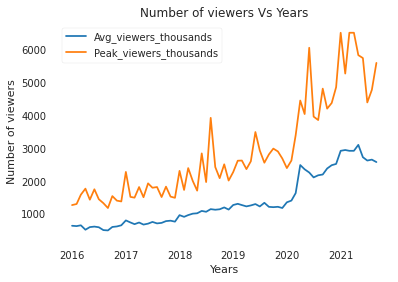

In [ ]:
fig, ax = plt.subplots()
# finding number of peak viewers in thousands and storing this data in column Peak_viewers_thousands
df["Peak_viewers_thousands"]=df["Peak_viewers"]/1000
# Comparing and plotting Peak-viewers in thousands and Average-viewers in thousands
ax.plot(df["month-year"],df["Avg_viewers_thousands"], label='Avg_viewers_thousands')
ax.plot(df["month-year"],df["Peak_viewers_thousands"], label='Peak_viewers_thousands')
ax.set_xlabel('Years')
ax.set_ylabel('Number of viewers')
ax.set_title('Number of viewers Vs Years')
ax.legend()
plt.show()

### Plotitng Number of streams in millions Vs Year

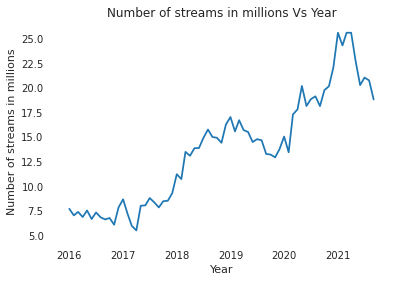

In [ ]:
# converting the string month-year to datetime
df["month-year"]=pd.to_datetime(df["month-year"])
# finding number of streams in millions storing this data in column Streams_millions
df["Streams_millions"]=df["Streams"]/1000000
# plotting Stream-millions Vs month-year
plt.plot(df["month-year"],df["Streams_millions"])
plt.xlabel("Year")
plt.ylabel("Number of streams in millions")
plt.title("Number of streams in millions Vs Year")
plt.show()

### Plotitng Average channels in thousands Vs Year

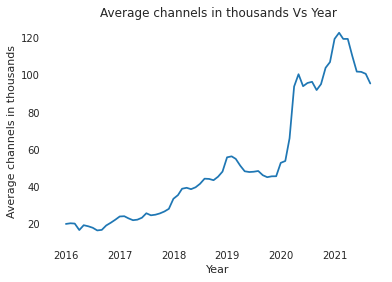

In [ ]:
df["month-year"]=pd.to_datetime(df["month-year"])
df["Avg_channels_thousands"]=df["Avg_channels"]/1000
plt.plot(df["month-year"],df["Avg_channels_thousands"])
plt.xlabel("Year")
plt.ylabel("Average channels in thousands")
plt.title("Average channels in thousands Vs Year")
plt.show()


### Plotitng Number of games streamed in thousands Vs Year

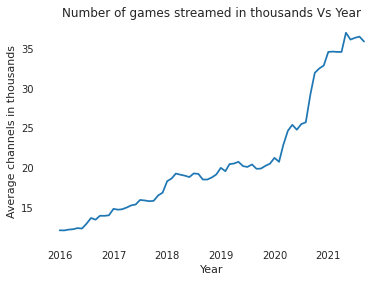

In [ ]:
df["month-year"]=pd.to_datetime(df["month-year"])
df["Games_streamed"]=df["Games_streamed"].str.replace(',','')
df["Games_streamed_thousands"]=df["Games_streamed"].astype(float)/1000
plt.plot(df["month-year"],df["Games_streamed_thousands"])
plt.xlabel("Year")
plt.ylabel("Average channels in thousands")
plt.title("Number of games streamed in thousands Vs Year")
plt.show()

### Plotitng Number of games streamed in thousands Vs Year


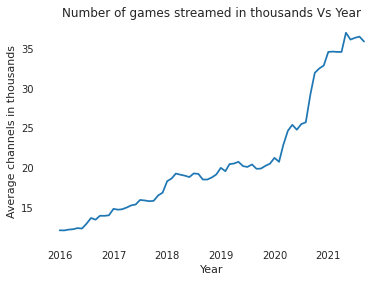

In [ ]:
df["month-year"]=pd.to_datetime(df["month-year"])
df["Games_streamed"]=df["Games_streamed"].str.replace(',','')
df["Games_streamed_thousands"]=df["Games_streamed"].astype(float)/1000
plt.plot(df["month-year"],df["Games_streamed_thousands"])
plt.xlabel("Year")
plt.ylabel("Average channels in thousands")
plt.title("Number of games streamed in thousands Vs Year")
plt.show()

### OBSERVED RESULTS
1) Average number of hours watched in millions: : increased (almost doubled by start of 2020)

2) Average number of viewers in thousands: increased (almost doubled by august 2021)

3) Comparison between average number of viewers and peak number of viewers

4) Average Streams in millions: gradual increase (there is a drop in the start of 2020 as compared to 2019 probably because people were more worried about COVID news)

5) Average channels in thousands: a sudden spike is observed in 2020

6) Games streamed in thousands: spike in 2020 and 2021

In [ ]:
# pandas profiling
pp.ProfileReport(df)

Summarize dataset:   0%|          | 0/27 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Section 3: Flights Dataset

In [ ]:
df_dep = pd.read_csv("Dataset/International_Report_Passengers.csv")
df_ps = pd.read_csv("Dataset/International_Report_Departures.csv")
df_airports = pd.read_csv("Dataset/airport-codes_csv.csv")

In [ ]:
df_dep.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 680985 entries, 0 to 680984
Data columns (total 16 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   data_dte      680985 non-null  object
 1   Year          680985 non-null  int64 
 2   Month         680985 non-null  int64 
 3   usg_apt_id    680985 non-null  int64 
 4   usg_apt       680985 non-null  object
 5   usg_wac       680985 non-null  int64 
 6   fg_apt_id     680985 non-null  int64 
 7   fg_apt        680985 non-null  object
 8   fg_wac        680985 non-null  int64 
 9   airlineid     680985 non-null  int64 
 10  carrier       678188 non-null  object
 11  carriergroup  680985 non-null  int64 
 12  type          680985 non-null  object
 13  Scheduled     680985 non-null  int64 
 14  Charter       680985 non-null  int64 
 15  Total         680985 non-null  int64 
dtypes: int64(11), object(5)
memory usage: 83.1+ MB


In [ ]:
df_dep.head()

,data_dte,Year,Month,usg_apt_id,usg_apt,usg_wac,fg_apt_id,fg_apt,fg_wac,airlineid,carrier,carriergroup,type,Scheduled,Charter,Total
0,05/01/2014,2014,5,14492,RDU,36,11032,CUN,148,19534,AM,0,Passengers,0,315,315
1,06/01/2007,2007,6,13204,MCO,33,16085,YHZ,951,20364,C6,0,Passengers,0,683,683
2,12/01/2005,2005,12,11433,DTW,43,10411,AUA,277,20344,RD,1,Passengers,0,1010,1010
3,04/01/2003,2003,4,13487,MSP,63,16304,ZIH,148,20204,MG,1,Passengers,0,508,508
4,12/01/2005,2005,12,12016,GUM,5,11138,CRK,766,20312,TZ,1,Passengers,0,76,76


In [ ]:
df_dep.shape 

(680985, 16)

In [ ]:
#drop duplicates - Observation: No duplicates
df_dep.drop_duplicates(inplace=True) #680985 rows × 16 columns -- No duplicates
#remove missing values
df_dep.dropna(inplace=True)#(678188, 16)

In [ ]:
df_airports.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 57421 entries, 0 to 57420
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   ident         57421 non-null  object 
 1   type          57421 non-null  object 
 2   name          57421 non-null  object 
 3   elevation_ft  49608 non-null  float64
 4   continent     28978 non-null  object 
 5   iso_country   57175 non-null  object 
 6   iso_region    57421 non-null  object 
 7   municipality  51527 non-null  object 
 8   gps_code      41561 non-null  object 
 9   iata_code     9225 non-null   object 
 10  local_code    30030 non-null  object 
 11  coordinates   57421 non-null  object 
dtypes: float64(1), object(11)
memory usage: 5.3+ MB


## Handling missing and duplicate data

In [ ]:
#drop duplicates - Observation: No duplicates
df_airports.drop_duplicates(inplace=True) #(57421, 12)

#remove missing values -- this is not helping!!
#df_airports.dropna(inplace=True)#(9194, 7)

#run the below only once
df_airports.drop(['municipality', 'gps_code','elevation_ft','continent','local_code'], axis=1,inplace=True)

#retain only 1 line for iata code
df_airports.drop_duplicates(subset=['iata_code'], inplace = True)

In [ ]:
pp.ProfileReport(df_airports)

Summarize dataset:   0%|          | 0/20 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
## Feature Engineering

In [ ]:
#extract date
df_dep['date'] = pd.to_datetime(df_dep["data_dte"])#.dt.strftime('%d/%m/%y'))

In [ ]:
df_full = df_dep.copy()

In [ ]:
#drop data before 2018
index_names = df_dep[ df_dep['date'].dt.year < 2018 ].index
# drop these row indexes
df_dep.drop(index_names, inplace = True)#new shape (68751, 17)

In [ ]:
df_subset = df_dep.copy()
index_names = df_subset[ df_subset['date'].dt.year < 2020 ].index
df_subset.drop(index_names, inplace = True)

## Merge Datasets

In [ ]:
#mapping airport ID to name
def extract_country(code):
  if len(df_airports['iata_code']==code) == 0:
    val = "NA"
  elif len(df_airports[df_airports['iata_code']==code]['iso_country']) == 0:
    val = "NA"
  elif df_airports[df_airports['iata_code']==code]['iso_country'].empty == True:
    val = "NA"
  else:
    val = df_airports[df_airports['iata_code']==code]['iso_country'].item()
  return val

def extract_region(code):
  if len(df_airports['iata_code']==code) == 0:
    return "NA"
  if len(df_airports[df_airports['iata_code']==code]['iso_region']) == 0:
    return "NA"
  if df_airports[df_airports['iata_code']==code]['iso_region'].empty == True:
    return "NA"
  return df_airports[df_airports['iata_code']==code]['iso_region'].item()

def extract_coordinates(code):
  if len(df_airports['iata_code']==code) == 0:
    return "NA"
  if len(df_airports[df_airports['iata_code']==code]['coordinates']) == 0:
    return "NA"
  if df_airports[df_airports['iata_code']==code]['coordinates'].empty == True:
    return "NA"
  return df_airports[df_airports['iata_code']==code]['coordinates'].item()

#this processing is done only for year 2020
df_subset['Destination_Airport_Country'] = df_subset['fg_apt'].apply(extract_country)
df_subset['Destination_Airport_Region'] = df_subset['fg_apt'].apply(extract_region)
df_subset['coordinates'] = df_subset['fg_apt'].apply(extract_coordinates)

In [ ]:
df_subset.head()

,data_dte,Year,Month,usg_apt_id,usg_apt,usg_wac,fg_apt_id,fg_apt,fg_wac,airlineid,carrier,carriergroup,type,Scheduled,Charter,Total,date,Destination_Airport_Country,Destination_Airport_Region,coordinates
134494,01/01/2020,2020,1,10158,ACY,21,16271,YYZ,936,21161,09Q,1,Passengers,0,142,142,2020-01-01,CA,CA-ON,"-79.63059997559999, 43.6772003174"
134495,01/01/2020,2020,1,10185,AEX,72,10711,BOG,327,21161,09Q,1,Passengers,0,102,102,2020-01-01,CO,CO-CUN,"-74.1469, 4.70159"
134496,01/01/2020,2020,1,10185,AEX,72,12010,GUA,127,21161,09Q,1,Passengers,0,633,633,2020-01-01,GT,GT-GU,"-90.527496, 14.5833"
134497,01/01/2020,2020,1,10185,AEX,72,12051,GYE,337,21161,09Q,1,Passengers,0,338,338,2020-01-01,EC,EC-G,"-79.88359832760001, -2.1574199199699997"
134498,01/01/2020,2020,1,10185,AEX,72,12693,KIN,243,21161,09Q,1,Passengers,0,88,88,2020-01-01,JM,JM-01,"-76.7874984741211, 17.935699462890625"


In [ ]:
df_dep.head()

,data_dte,Year,Month,usg_apt_id,usg_apt,usg_wac,fg_apt_id,fg_apt,fg_wac,airlineid,carrier,carriergroup,type,Scheduled,Charter,Total,date
115673,03/01/2018,2018,3,15618,VNY,91,13289,MHH,204,21568,VJT,0,Passengers,0,5,5,2018-03-01
115674,03/01/2019,2019,3,13898,OPF,33,10205,AGP,482,21995,LXQ,0,Passengers,0,3,3,2019-03-01
124479,10/01/2018,2018,10,10154,ACK,13,10711,BOG,327,21196,0CQ,0,Passengers,0,1,1,2018-10-01
124480,10/01/2018,2018,10,10172,ADW,35,13618,NBW,219,20402,GL,1,Passengers,0,59,59,2018-10-01
124481,10/01/2018,2018,10,10257,ALB,22,16217,YUL,941,21080,04Q,1,Passengers,0,4,4,2018-10-01


In [ ]:
df_dep['Year'].value_counts()

2018    30772
2019    30413
2020     7566
Name: Year, dtype: int64

## Exploratory Data Visualization

### Plot 1: Overal departure flight counts trend for years 1990 - 2020

Text(0.5, 1.0, 'Overal departure flight counts trend for years 1990 - 2020')

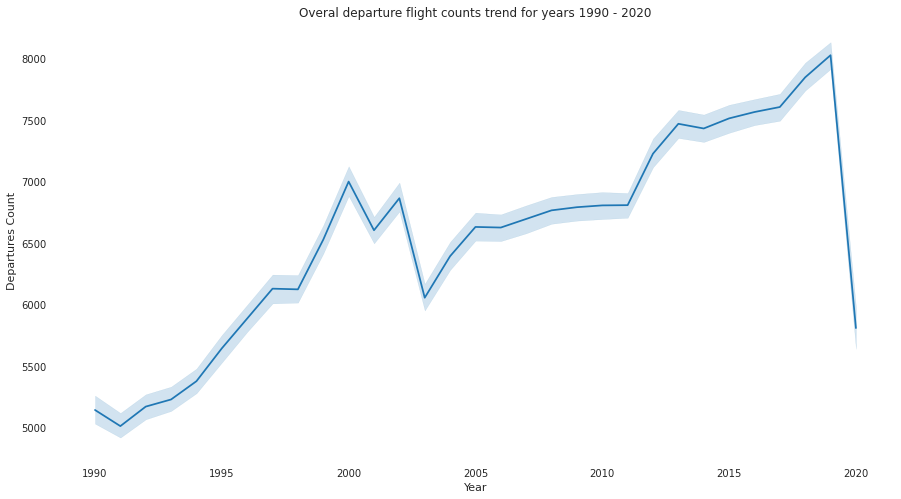

In [ ]:
plt.figure(figsize = (15,8))
sns.lineplot(data=df_full, x ='Year', y='Total')
plt.ylabel('Departures Count')
plt.title('Overal departure flight counts trend for years 1990 - 2020')

### Plot 2: Overal departure flight counts monthly trend for the years (2018 to 2020)

Text(0.5, 1.0, 'Overal departure flight counts monthly trend for the years (2018 to 2020)')

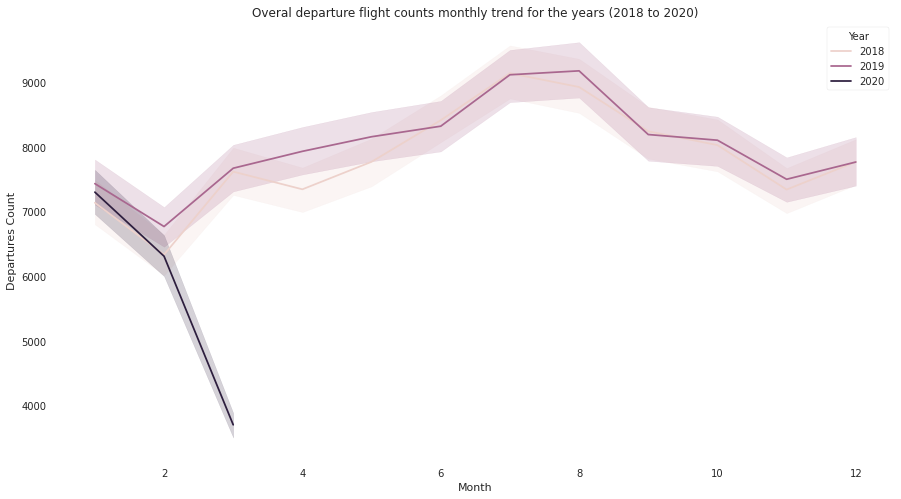

In [ ]:
#plot 1 line for each year [to see trends within the month]
#2018, 2019, 2020
plt.figure(figsize = (15,8))
sns.lineplot(data=df_dep, x ='Month', y='Total', hue = 'Year')
plt.ylabel('Departures Count')
plt.title('Overal departure flight counts monthly trend for the years (2018 to 2020)')

### Plot 3: Drill-down trend chart for months from Januray to March for the top 15 countries when COVID started spreading out to other countries from its origin

In [ ]:
df_2020 = df_subset.copy()
df_2020.head()

,data_dte,Year,Month,usg_apt_id,usg_apt,usg_wac,fg_apt_id,fg_apt,fg_wac,airlineid,carrier,carriergroup,type,Scheduled,Charter,Total,date,Destination_Airport_Country,Destination_Airport_Region,coordinates
134494,01/01/2020,2020,1,10158,ACY,21,16271,YYZ,936,21161,09Q,1,Passengers,0,142,142,2020-01-01,CA,CA-ON,"-79.63059997559999, 43.6772003174"
134495,01/01/2020,2020,1,10185,AEX,72,10711,BOG,327,21161,09Q,1,Passengers,0,102,102,2020-01-01,CO,CO-CUN,"-74.1469, 4.70159"
134496,01/01/2020,2020,1,10185,AEX,72,12010,GUA,127,21161,09Q,1,Passengers,0,633,633,2020-01-01,GT,GT-GU,"-90.527496, 14.5833"
134497,01/01/2020,2020,1,10185,AEX,72,12051,GYE,337,21161,09Q,1,Passengers,0,338,338,2020-01-01,EC,EC-G,"-79.88359832760001, -2.1574199199699997"
134498,01/01/2020,2020,1,10185,AEX,72,12693,KIN,243,21161,09Q,1,Passengers,0,88,88,2020-01-01,JM,JM-01,"-76.7874984741211, 17.935699462890625"


In [ ]:
#2019 - top 20
top_15_countries = list(df_2020.groupby('Destination_Airport_Country', sort = True).sum()['Total'].nlargest(15).index)
top_15_countries

['MX',
 'CA',
 'GB',
 'JP',
 'DE',
 'DO',
 'FR',
 'KR',
 'BR',
 'JM',
 'NL',
 'CR',
 'CO',
 'CN',
 'PA']

Text(0.5, 1.0, 'Drill-down trend chart for months from Januray to March for the top 15 countries')

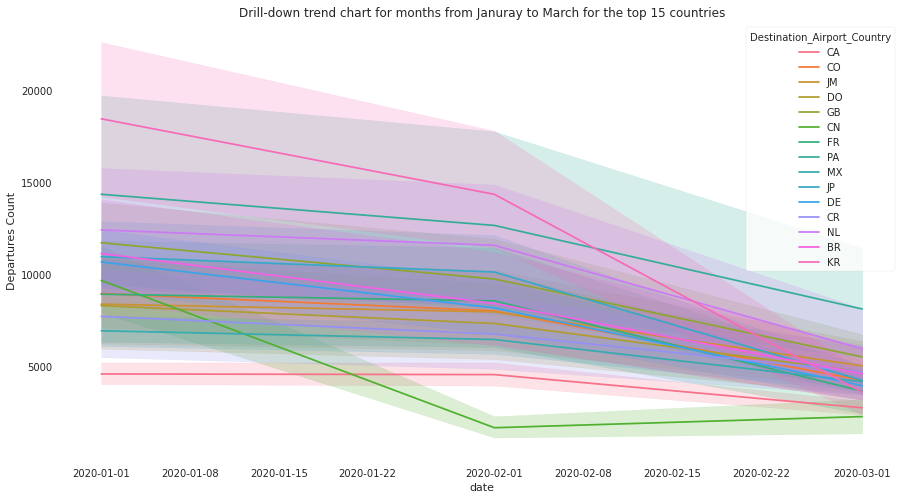

In [ ]:
#top 15 countries
plt.figure(figsize = (15,8))
sns.lineplot(data = df_2020[df_2020['Destination_Airport_Country'].isin(top_15_countries)], x = 'date', y = 'Total', hue = 'Destination_Airport_Country')
plt.ylabel('Departures Count')
plt.title("Drill-down trend chart for months from Januray to March for the top 15 countries")

# Observations



1.   Flight departure from US clearly indicates a drastic dip in themonth of February 2020 which is lower even in comparison to flight counts in the year 2000.  
2.   In the drill down chart for top 15 countries, we can observe that the the biggist dip is contributed by China which can be reasoned out by the country of origin for COVID. 
3. Countried that didn't experience a reduction in flight traffic during the initial months of March and February include Canada, Columbia, Frame which can be correlated to the COVID rate in that country at the time. 


# Section 4: Suicide Rate

In [ ]:
# 3. Suicide rate

# Reading the file
df = pd.read_csv("Dataset/suicide_selected_indicators_of_mortality.csv")

## Filtering out the unwanted data

In [ ]:
# Filtering out the unwanted data
df = df[df['Cause of Death'] == "Suicide"]
df = df[df['Time Period'] == "3-month period"]
df = df[df['Rate Type'] == "Crude"]

## Standardising the date

In [ ]:
# Standardising the date
df['Year and Quarter'] = df['Year and Quarter'].str.replace('Q1', 'January 01')
df['Year and Quarter'] = df['Year and Quarter'].str.replace('Q2', 'April 01')
df['Year and Quarter'] = df['Year and Quarter'].str.replace('Q3', 'July 01')
df['Year and Quarter'] = df['Year and Quarter'].str.replace('Q4', 'October 01')

In [ ]:
df.head()

,Year and Quarter,Time Period,Cause of Death,Rate Type,Unit,Overall Rate,Rate Sex Female,Rate Sex Male,Rate Age 1-4,Rate Age 5-14,Rate Age 15-24,Rate Age 25-34,Rate Age 35-44,Rate Age 45-54,Rate Age 55-64,Rate 65-74,Rate Age 75-84,Rate Age 85 plus,Rate Alaska,Rate Alabama,Rate Arkansas,Rate Arizona,Rate California,Rate Colorado,Rate Connecticut,Rate District of Columbia,Rate Delaware,Rate Florida,Rate Georgia,Rate Hawaii,Rate Iowa,Rate Idaho,Rate Illinois,Rate Indiana,Rate Kansas,Rate Kentucky,Rate Louisiana,Rate Massachusetts,Rate Maryland,Rate Maine,Rate Michigan,Rate Minnesota,Rate Missouri,Rate Mississippi,Rate Montana,Rate North Carolina,Rate North Dakota,Rate Nebraska,Rate New Hampshire,Rate New Jersey,Rate New Mexico,Rate Nevada,Rate New York,Rate Ohio,Rate Oklahoma,Rate Oregon,Rate Pennsylvania,Rate Rhode Island,Rate South Carolina,Rate South Dakota,Rate Tennessee,Rate Texas,Rate Utah,Rate Virginia,Rate Vermont,Rate Washington,Rate Wisconsin,Rate West Virginia,Rate Wyoming
438,2017 January 01,3-month period,Suicide,Crude,"Deaths per 100,000",13.5,5.9,21.3,NaN,1.2,13.3,15.9,16.4,19.3,17.6,14.7,17.1,20.2,20.0,17.4,16.3,17.0,10.5,19.9,9.3,4.1,9.6,14.5,12.9,14.8,13.8,19.7,10.8,14.6,17.6,16.1,14.0,8.5,9.3,20.7,12.5,12.2,17.6,14.1,28.3,14.5,17.5,11.5,17.9,9.2,24.9,18.7,7.8,12.6,19.1,20.1,14.8,13.2,15.8,18.5,17.4,12.9,22.7,12.5,15.4,16.1,15.6,20.4,21.3
482,2017 April 01,3-month period,Suicide,Crude,"Deaths per 100,000",15.1,6.6,23.9,NaN,1.4,15.2,17.9,18.1,21.4,20.6,16.6,18.6,19.9,28.6,19.1,24.4,19.8,11.3,21.8,11.8,8.7,11.7,15.4,14.3,16.8,14.5,22.7,12.2,16.5,20.1,17.8,16.9,10.4,10.6,20.4,16.9,15.6,19.2,15.0,37.4,15.4,19.6,14.8,20.9,8.4,23.4,22.6,8.9,16.0,22.1,19.5,16.6,9.8,19.6,24.9,17.2,14.2,19.4,14.3,23.7,17.6,16.2,24.6,24.1
526,2017 July 01,3-month period,Suicide,Crude,"Deaths per 100,000",15.3,6.6,24.3,NaN,1.1,14.6,19.3,19.7,20.8,19.7,16.7,19.3,21.3,29.2,17.7,23.2,20.8,11.5,21.6,12.3,9.8,16.2,16.3,15.0,16.8,18.4,27.2,11.0,18.6,17.7,20.6,17.2,11.0,10.9,20.4,14.8,14.0,19.4,14.7,28.5,15.5,24.4,17.7,21.4,8.3,23.2,21.4,9.5,15.6,18.6,21.0,17.0,12.5,15.1,25.3,18.9,14.1,23.2,14.8,14.1,19.7,16.9,21.8,31.8
570,2017 October 01,3-month period,Suicide,Crude,"Deaths per 100,000",14.0,6.0,22.3,NaN,1.3,14.7,17.0,17.5,19.3,18.2,14.4,16.9,18.9,30.3,14.3,20.2,18.1,10.4,20.9,11.8,4.6,9.1,15.3,13.4,15.1,14.2,21.7,12.0,15.9,20.6,14.7,13.4,9.8,10.9,20.6,14.3,14.3,19.1,15.8,24.3,13.9,20.1,13.3,18.7,9.4,22.6,20.9,8.0,15.6,17.1,19.0,15.0,13.2,16.2,19.3,16.0,12.3,20.2,14.0,18.6,16.8,15.2,19.6,31.2
614,2018 January 01,3-month period,Suicide,Crude,"Deaths per 100,000",14.2,6.0,22.6,NaN,1.6,15.1,16.6,16.9,19.1,19.2,15.7,17.8,17.6,25.5,18.0,17.5,18.9,10.9,22.4,12.1,5.7,10.0,15.2,14.5,10.1,14.3,24.4,10.9,15.5,20.9,16.4,13.1,9.2,9.5,18.2,15.3,13.1,18.4,13.1,20.8,14.4,21.1,12.1,18.6,8.2,23.1,21.9,8.6,15.3,17.2,20.5,15.5,9.5,14.5,20.9,16.2,13.9,19.4,14.0,17.3,16.2,14.7,20.5,29.1


## Choosing only state data

In [ ]:
# Choosing only state data
columns = list(df.columns)
desired_columns = []
for i in columns:
    if 'Rate' in i and ('Age' in i or 'Sex' in i):
        desired_columns.append(i)
desired_columns.append('Year and Quarter')
desired_columns

['Rate Sex Female',
 'Rate Sex Male',
 'Rate Age 1-4',
 'Rate Age 5-14',
 'Rate Age 15-24',
 'Rate Age 25-34',
 'Rate Age 35-44',
 'Rate Age 45-54',
 'Rate Age 55-64',
 'Rate Age 75-84',
 'Rate Age 85 plus',
 'Year and Quarter']

## Filtering out unwanted columns

In [ ]:
# Filtering out unwanted columns
df = df[desired_columns]
df.head()

,Rate Sex Female,Rate Sex Male,Rate Age 1-4,Rate Age 5-14,Rate Age 15-24,Rate Age 25-34,Rate Age 35-44,Rate Age 45-54,Rate Age 55-64,Rate Age 75-84,Rate Age 85 plus,Year and Quarter
438,5.9,21.3,NaN,1.2,13.3,15.9,16.4,19.3,17.6,17.1,20.2,2017 January 01
482,6.6,23.9,NaN,1.4,15.2,17.9,18.1,21.4,20.6,18.6,19.9,2017 April 01
526,6.6,24.3,NaN,1.1,14.6,19.3,19.7,20.8,19.7,19.3,21.3,2017 July 01
570,6.0,22.3,NaN,1.3,14.7,17.0,17.5,19.3,18.2,16.9,18.9,2017 October 01
614,6.0,22.6,NaN,1.6,15.1,16.6,16.9,19.1,19.2,17.8,17.6,2018 January 01


## Typecasting

In [ ]:
# Typecasting
df['Year and Quarter'] = pd.to_datetime(df['Year and Quarter'])
columns = list(df.columns)
columns.remove('Year and Quarter')
for i in columns:
    df[i] = df[i].astype(float)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [ ]:
df.head()

,Rate Sex Female,Rate Sex Male,Rate Age 1-4,Rate Age 5-14,Rate Age 15-24,Rate Age 25-34,Rate Age 35-44,Rate Age 45-54,Rate Age 55-64,Rate Age 75-84,Rate Age 85 plus,Year and Quarter
438,5.9,21.3,NaN,1.2,13.3,15.9,16.4,19.3,17.6,17.1,20.2,2017-01-01
482,6.6,23.9,NaN,1.4,15.2,17.9,18.1,21.4,20.6,18.6,19.9,2017-04-01
526,6.6,24.3,NaN,1.1,14.6,19.3,19.7,20.8,19.7,19.3,21.3,2017-07-01
570,6.0,22.3,NaN,1.3,14.7,17.0,17.5,19.3,18.2,16.9,18.9,2017-10-01
614,6.0,22.6,NaN,1.6,15.1,16.6,16.9,19.1,19.2,17.8,17.6,2018-01-01


## Saving the file

In [ ]:
# Saving the file
df.to_csv("suicide_cleaned.csv", index=False)

## Plots for EDA

Rate Sex Female


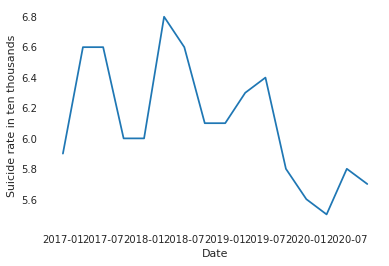

Rate Sex Male


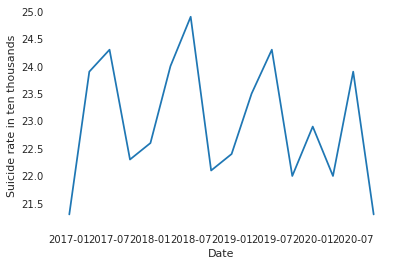

Rate Age 1-4


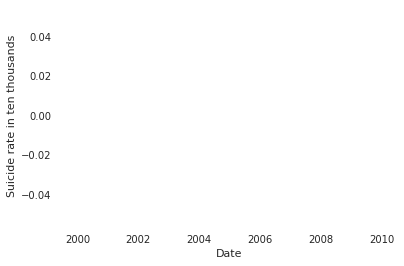

Rate Age 5-14


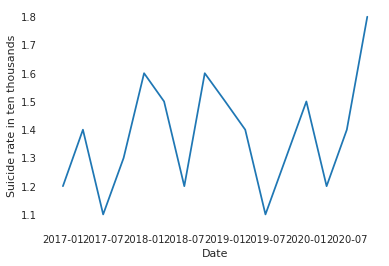

Rate Age 15-24


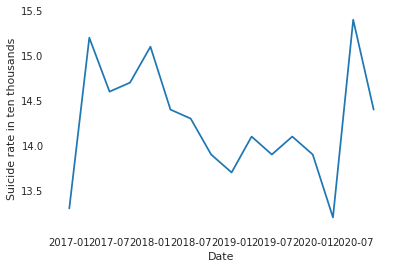

Rate Age 25-34


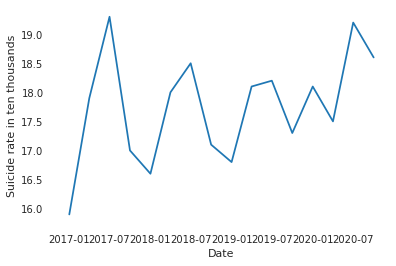

Rate Age 35-44


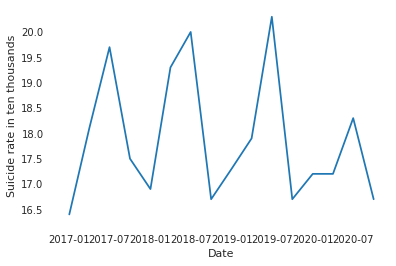

Rate Age 45-54


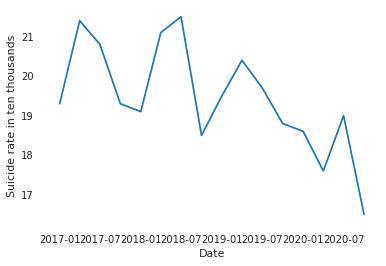

Rate Age 55-64


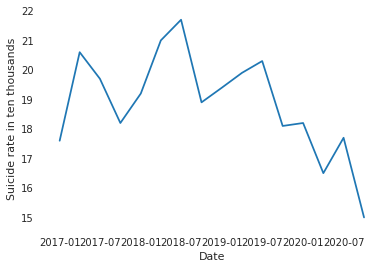

Rate Age 75-84


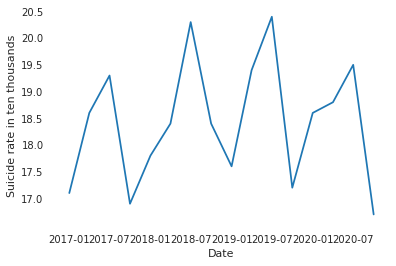

Rate Age 85 plus


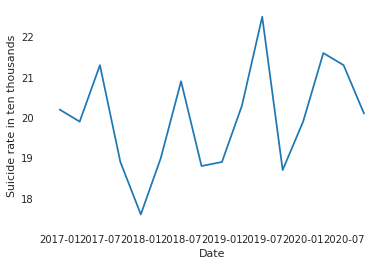

In [ ]:
# Plots for EDA
columns = list(df.columns)
columns.remove("Year and Quarter")
for i in columns:
    print (i)
    plt.plot(df['Year and Quarter'], df[i])
    plt.xlabel("Date")
    plt.ylabel("Suicide rate in ten thousands")
    plt.show()

### Overview results (During COVID time)
1. Overall rate -> Decreased
2. Female rate -> Decreased
3. Age 15 to 24 -> Decreased and Increased
4. Age 25 to 34 -> Increased
5. Age 35 to 34 -> Decreased
6. Age 35 to 44 -> Decreased
7. Age 45 to 54 -> Decreased
8. Age 55 to 64 -> Decreased
9. Age 65 to 74 -> Decreased

In [ ]:
#Section5 - CLIMATE 

# Section 5. Air Quality

## Importing Air Quality Open Data

In [ ]:
# data from 2019
df_raw1 = pd.read_csv("Dataset/waqi-covid-2019Q1.csv", encoding = "UTF-8")
df_raw2 = pd.read_csv("Dataset/waqi-covid-2019Q2.csv", encoding = "UTF-8")
df_raw3 = pd.read_csv("Dataset/waqi-covid-2019Q3.csv", encoding = "UTF-8")
df_raw4 = pd.read_csv("Dataset/waqi-covid-2019Q4.csv", encoding = "UTF-8")
# data from 2020
df_raw5 = pd.read_csv("Dataset/waqi-covid-2020Q1.csv", encoding = "UTF-8")
df_raw6 = pd.read_csv("Dataset/waqi-covid-2020Q2.csv", encoding = "UTF-8")
df_raw7 = pd.read_csv("Dataset/waqi-covid-2020Q3.csv", encoding = "UTF-8")
df_raw8 = pd.read_csv("Dataset/waqi-covid-2020Q4.csv", encoding = "UTF-8")
# data from 2021
df_raw9 = pd.read_csv("Dataset/waqi-covid-2021.csv", encoding = "UTF-8")

df_raw = pd.concat([df_raw1, df_raw2, df_raw3, df_raw4, df_raw5, df_raw6, df_raw7, df_raw8, df_raw9])

country_code_df = pd.read_csv("Dataset/country_code_to_name.csv", encoding="UTF-8")

## Explore the raw data

In [ ]:
print(df_raw.head())
print(df_raw.shape)

         Date Country       City Specie  count    min    max  median  variance
0  2019-01-16      AE  Abu Dhabi   pm10     24   86.0   99.0    97.0    179.40
1  2019-01-22      AE  Abu Dhabi   pm10     24   51.0   57.0    55.0     23.75
2  2019-01-26      AE  Abu Dhabi   pm10     24  136.0  173.0   160.0    941.96
3  2019-01-07      AE  Abu Dhabi   pm10     24   60.0   91.0    72.0   1006.88
4  2019-01-10      AE  Abu Dhabi   pm10     24   82.0   93.0    87.0     57.97
(6298271, 9)


In [ ]:
print(country_code_df.head())

df_with_country_name = df_raw.merge(country_code_df, left_on='Country', right_on='Code')
df_with_country_name = df_with_country_name.drop(columns = ['Country'])
df_with_country_name = df_with_country_name.rename(columns = {'Name':'Country', 'Code':'Country Code'})
df_with_country_name = df_with_country_name[df_with_country_name['Country'] != 'Greece'] #Greece has weird data!
print(df_with_country_name.head())

             Name Code
0     Afghanistan   AF
1   Åland Islands   AX
2         Albania   AL
3         Algeria   DZ
4  American Samoa   AS
         Date       City Specie  ...  variance               Country  Country Code
0  2019-01-16  Abu Dhabi   pm10  ...    179.40  United Arab Emirates            AE
1  2019-01-22  Abu Dhabi   pm10  ...     23.75  United Arab Emirates            AE
2  2019-01-26  Abu Dhabi   pm10  ...    941.96  United Arab Emirates            AE
3  2019-01-07  Abu Dhabi   pm10  ...   1006.88  United Arab Emirates            AE
4  2019-01-10  Abu Dhabi   pm10  ...     57.97  United Arab Emirates            AE

[5 rows x 10 columns]


Countries in the data

In [ ]:
countries_list = df_with_country_name['Country'].unique()
print(countries_list)
print(countries_list.shape)

countries_code_list = df_raw['Country'].unique()
print(countries_code_list)
print(countries_code_list.shape)

['United Arab Emirates' 'Czech Republic' 'Singapore' 'Austria' 'Belgium'
 'Korea, Republic of' 'Mongolia' 'Norway' 'Nepal' 'Peru'
 'Bosnia and Herzegovina' 'Brazil' 'Israel' 'India'
 'Iran, Islamic Republic of' 'New Zealand' 'Ukraine' 'United States'
 'France' 'Kuwait' 'Réunion' 'Turkey' 'Uzbekistan' 'Finland' 'Japan'
 'Kazakhstan' 'Romania' 'Russian Federation' 'Slovakia' 'Spain'
 'Hong Kong' 'Croatia' 'Malaysia' 'Thailand' 'Sri Lanka' 'Argentina'
 'Canada' 'Switzerland' 'Chile' 'Ethiopia' 'Kyrgyzstan' 'Curaçao'
 'Germany' 'Mexico' 'Saudi Arabia' 'Uganda' 'Bangladesh' 'Hungary'
 'Iceland' 'Philippines' 'Indonesia' 'Macao' 'Sweden' 'El Salvador'
 'Viet Nam' 'Australia' 'Bahrain' 'United Kingdom' 'Ireland'
 "Lao People's Democratic Republic" 'Lithuania' 'Puerto Rico' 'Portugal'
 'Taiwan, Province of China' 'China' 'Poland' 'Bulgaria' 'Cyprus' 'Iraq'
 'Macedonia, the Former Yugoslav Republic of'
 'Bolivia, Plurinational State of' 'Denmark' 'Ecuador' 'South Africa'
 'Colombia' 'Estonia' '

Cities in the dataset

In [ ]:
cities_list = df_with_country_name['City'].unique()
print(cities_list)
print(cities_list.shape)

['Abu Dhabi' 'Dubai' 'Prague' 'Ostrava' 'Brno' 'Pilsen' 'Olomouc'
 'Singapore' 'Salzburg' 'Linz' 'Innsbruck' 'Vienna' 'Graz' 'Liège'
 'Brussels' 'Charleroi' 'Gent' 'Namur' 'Antwerpen' 'Jeonju' 'Seoul'
 'Busan' 'Sejong' 'Ulsan' 'Yeosu' 'Gwangju' 'Seongnam-si' 'Daejeon'
 'Pohang' 'Changwon' 'Suwon' 'Cheongju-si' 'Chuncheon' 'Daegu' 'Jeju City'
 'Incheon' 'Suncheon' 'Mokpo' 'Andong' 'Ulan Bator' 'Trondheim' 'Oslo'
 'Stavanger' 'Bergen' 'Kathmandu' 'Pokhara' 'Biratnagar' 'Lima' 'Sarajevo'
 'Zenica' 'Tuzla' 'São José dos Campos' 'São Paulo' 'Vitória' 'Tel Aviv'
 'Haifa' 'Jerusalem' 'Ashdod' 'Netanya' 'Ashkelon' 'Petaẖ Tiqwa'
 'New Delhi' 'Hyderabad' 'Delhi' 'Chandigarh' 'Bhopal' 'Lucknow'
 'Ghāziābād' 'Hāpur' 'Gandhinagar' 'Chennai' 'Nashik' 'Visakhapatnam'
 'Mumbai' 'Jaipur' 'Patna' 'Muzaffarnagar' 'Thiruvananthapuram'
 'Bengaluru' 'Kolkata' 'Thrissur' 'Shillong' 'Nagpur' 'Mysore' 'Isfahan'
 'Arāk' 'Karaj' 'Qom' 'Orūmīyeh' 'Yazd' 'Īlām' 'Kerman' 'Khorramshahr'
 'Tabriz' 'Sanandaj' 'Kermans

In [ ]:
data_species_list = df_with_country_name['Specie'].unique()
print(data_species_list)
print(data_species_list.shape)

['pm10' 'humidity' 'o3' 'so2' 'wind-speed' 'wind-gust' 'dew' 'pm25' 'no2'
 'pressure' 'temperature' 'co' 'wind speed' 'wind gust' 'precipitation'
 'wd' 'pm1' 'uvi' 'aqi' 'pol' 'mepaqi' 'neph']
(22,)


In [ ]:
print(df_with_country_name.shape)
df_remove_nan = df_with_country_name.dropna(subset=list(df_with_country_name.columns), how = "any")
print(df_remove_nan.shape)
# this shows that there are no na values in the dateset as nothing got removed

(6273349, 10)
(6273349, 10)


Converting data types

In [ ]:
df_with_country_name.rename(columns = {
    col : f"{col} ({dtype})"
    for col, dtype in df_with_country_name.dtypes.to_dict().items()
}).head()

,Date (object),City (object),Specie (object),count (int64),min (float64),max (float64),median (float64),variance (float64),Country (object),Country Code (object)
0,2019-01-16,Abu Dhabi,pm10,24,86.0,99.0,97.0,179.40,United Arab Emirates,AE
1,2019-01-22,Abu Dhabi,pm10,24,51.0,57.0,55.0,23.75,United Arab Emirates,AE
2,2019-01-26,Abu Dhabi,pm10,24,136.0,173.0,160.0,941.96,United Arab Emirates,AE
3,2019-01-07,Abu Dhabi,pm10,24,60.0,91.0,72.0,1006.88,United Arab Emirates,AE
4,2019-01-10,Abu Dhabi,pm10,24,82.0,93.0,87.0,57.97,United Arab Emirates,AE


In [ ]:
df_type_converted = df_with_country_name.astype({
    "Date": "datetime64",
    "Country": str,
    "City": str,
    "Specie": str,
    "count": int,
    "min": float,
    "max": float,
    "median": float,
    "variance": float
})
df_type_converted.rename(columns = {
    col : f"{col} ({dtype})"
    for col, dtype in df_type_converted.dtypes.to_dict().items()
}).head()

df_type_converted["Year"] = df_type_converted.apply(lambda row: row['Date'].year, axis=1)
df_type_converted["Month"] = df_type_converted.apply(lambda row: row['Date'].month, axis=1)

Start and end dates of the data

In [ ]:
# start and end dates of the data
start_date = min(df_type_converted['Date'])
print(start_date)
end_date = max(df_type_converted['Date'])
print(end_date)

2018-12-31 00:00:00
2021-11-21 00:00:00


In [ ]:
datasets = {}
for specie in data_species_list:
  datasets[specie] = df_type_converted[df_type_converted['Specie'] == specie]

# datasets is a dictionary of dataframes
print(datasets['pm10'].head())

        Date       City Specie  ...  Country Code  Year  Month
0 2019-01-16  Abu Dhabi   pm10  ...            AE  2019      1
1 2019-01-22  Abu Dhabi   pm10  ...            AE  2019      1
2 2019-01-26  Abu Dhabi   pm10  ...            AE  2019      1
3 2019-01-07  Abu Dhabi   pm10  ...            AE  2019      1
4 2019-01-10  Abu Dhabi   pm10  ...            AE  2019      1

[5 rows x 12 columns]


In [ ]:
# from scipy import stats

# for specie in data_species_list:
#   datasets[specie] = datasets[specie][(np.abs(stats.zscore(datasets[specie]['median'])) < 2.5)]

Metrics that we are interested in.

In [ ]:
species_of_interest = ['pm10' , 'o3', 'so2','pm25', 'no2', 'co']

## Explore the metrics by countries and cities

In [ ]:
def explore_regions(datasets, spec, k, column = 'Country'):
  start_year = 2019
  mid_year = 2020
  end_year = 2021

  if column == 'Country':
    plural = 'countries'
  if column == 'City':
    plural = 'cities'

  start_year_data = datasets[spec][datasets[spec]['Year'] == start_year]
  mid_year_data = datasets[spec][datasets[spec]['Year'] == mid_year]
  end_year_data = datasets[spec][datasets[spec]['Year'] == end_year]

  start_year_country = start_year_data.groupby(column)['median'].median().reset_index().rename(columns = {'median':'start_median'})
  mid_year_country = mid_year_data.groupby(column)['median'].median().reset_index().rename(columns = {'median':'mid_median'})
  end_year_country = end_year_data.groupby(column)['median'].median().reset_index().rename(columns = {'median':'end_median'})
  start_end_data = start_year_country.merge(end_year_country, on=column)
  start_end_data = start_end_data.merge(mid_year_country, on=column)
  start_end_data["Difference"] = start_end_data.apply(lambda row: (row['end_median'] + row['mid_median'])/2 -  row['start_median'], axis=1)

  largest_pve_changes = start_end_data.nlargest(k, 'Difference')
  print(f"The {plural} with {k} largest increases in {spec} from {start_year} to {end_year} are {largest_pve_changes[column].tolist()}")
  #print(largest_pve_changes)
  smallest_pve_changes = start_end_data.nsmallest(k, 'Difference')
  print(f"The {plural} with {k} smallest increases in {spec} from {start_year} to {end_year} are {smallest_pve_changes[column].tolist()}")
  #print(smallest_pve_changes)

  countries_filter = largest_pve_changes[column].tolist()

  dataset_country_filtered = datasets[spec].copy()
  dataset_country_filtered = dataset_country_filtered[dataset_country_filtered[column].isin(countries_filter)]

  dataset_country_filtered = dataset_country_filtered.pivot_table(index = "Date", columns = column, values = "median").reset_index()

  y = list(dataset_country_filtered.columns)
  y.remove('Date')

  dataset_country_filtered[y] = dataset_country_filtered[y].ewm(alpha=0.02, ignore_na=True).mean()

  x = 'Date'

  dataset_country_filtered.plot(x = x, y = y, figsize = (20,20), title = f"{spec} variation in {plural} (highest growth)")

  countries_filter = smallest_pve_changes[column].tolist()

  dataset_country_filtered = datasets[spec].copy()
  dataset_country_filtered = dataset_country_filtered[dataset_country_filtered[column].isin(countries_filter)]

  dataset_country_filtered = dataset_country_filtered.pivot_table(index = "Date", columns = column, values = "median").reset_index()

  y = list(dataset_country_filtered.columns)
  y.remove('Date')

  dataset_country_filtered[y] = dataset_country_filtered[y].ewm(alpha=0.02, ignore_na=True).mean()

  x = 'Date'

  dataset_country_filtered.plot(x = x, y = y, figsize = (20,20), title = f"{spec} variation in {plural} (highest decline)", ylabel = 'PPM')

  print('---------------------------------------------------------------------------------')


The countries with 3 largest increases in pm10 from 2019 to 2021 are ['Iran, Islamic Republic of', 'Saudi Arabia', 'Viet Nam']
The countries with 3 smallest increases in pm10 from 2019 to 2021 are ['Mongolia', 'Georgia', 'Indonesia']
---------------------------------------------------------------------------------
The countries with 3 largest increases in o3 from 2019 to 2021 are ['Israel', 'Georgia', 'Saudi Arabia']
The countries with 3 smallest increases in o3 from 2019 to 2021 are ['Peru', 'Philippines', 'Viet Nam']
---------------------------------------------------------------------------------
The countries with 3 largest increases in so2 from 2019 to 2021 are ['Iran, Islamic Republic of', 'Bosnia and Herzegovina', 'Mongolia']
The countries with 3 smallest increases in so2 from 2019 to 2021 are ['Peru', 'Singapore', 'Argentina']
---------------------------------------------------------------------------------
The countries with 3 largest increases in pm25 from 2019 to 2021 are ['

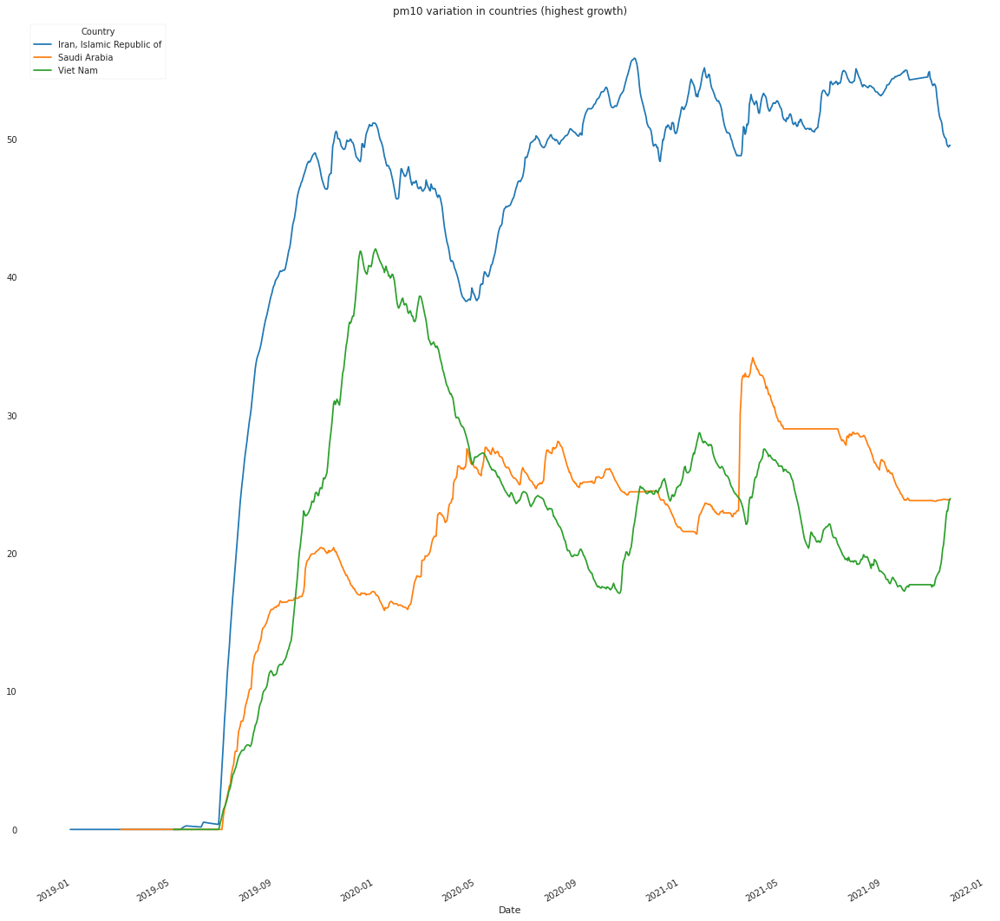

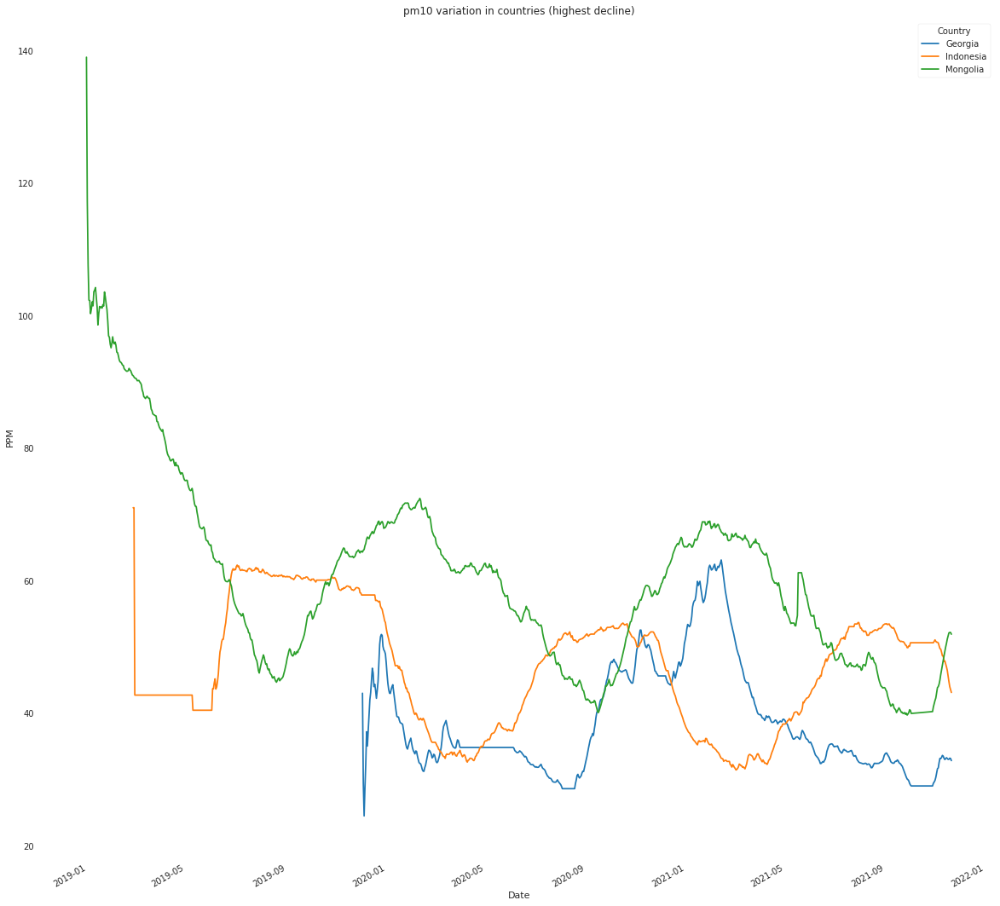

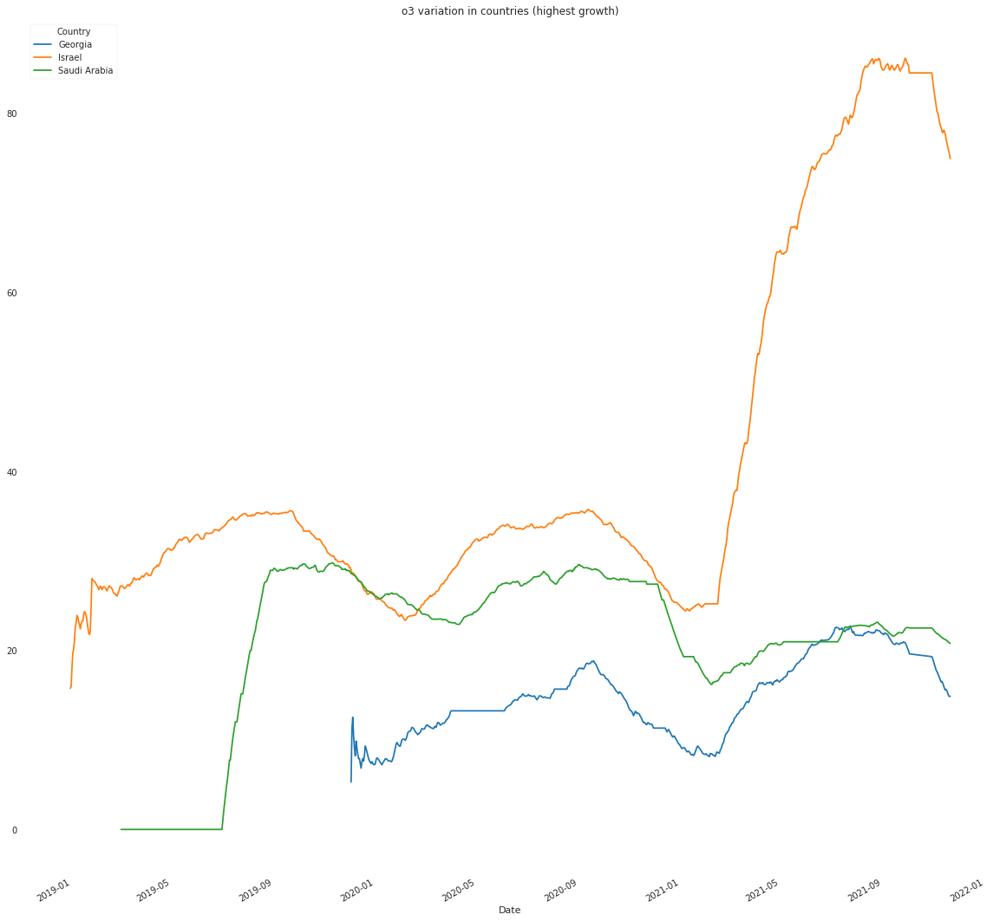

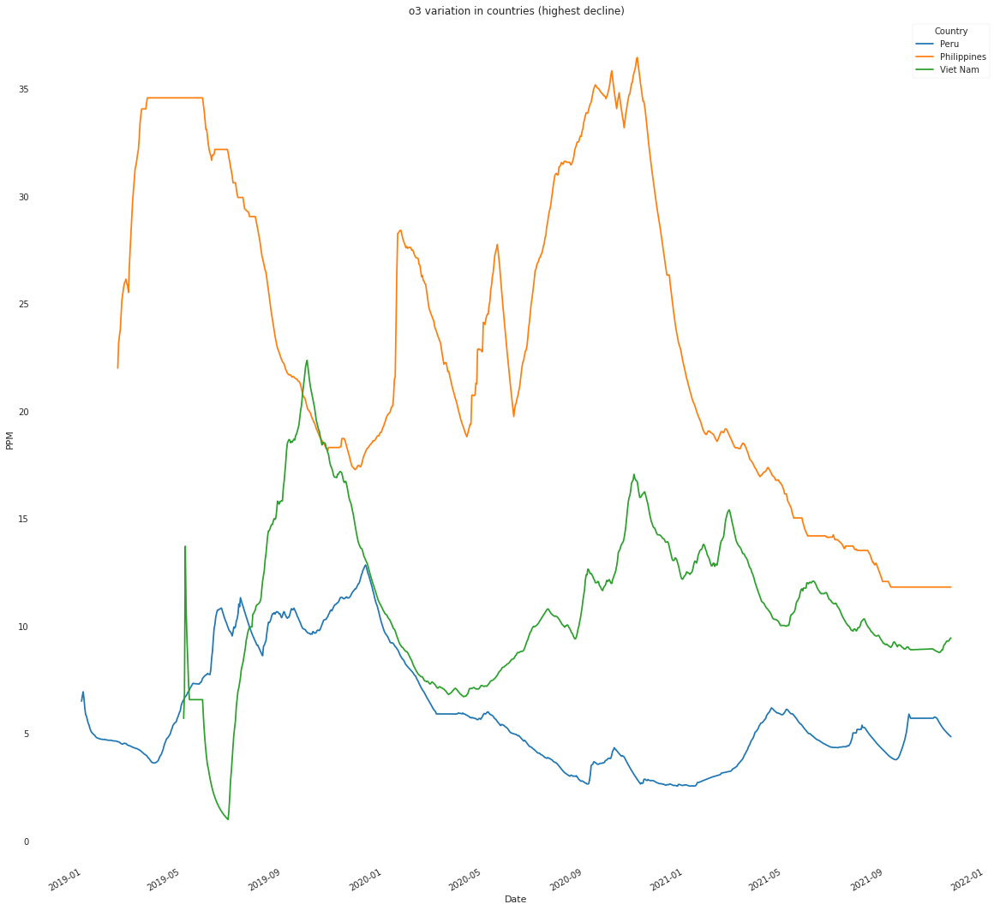

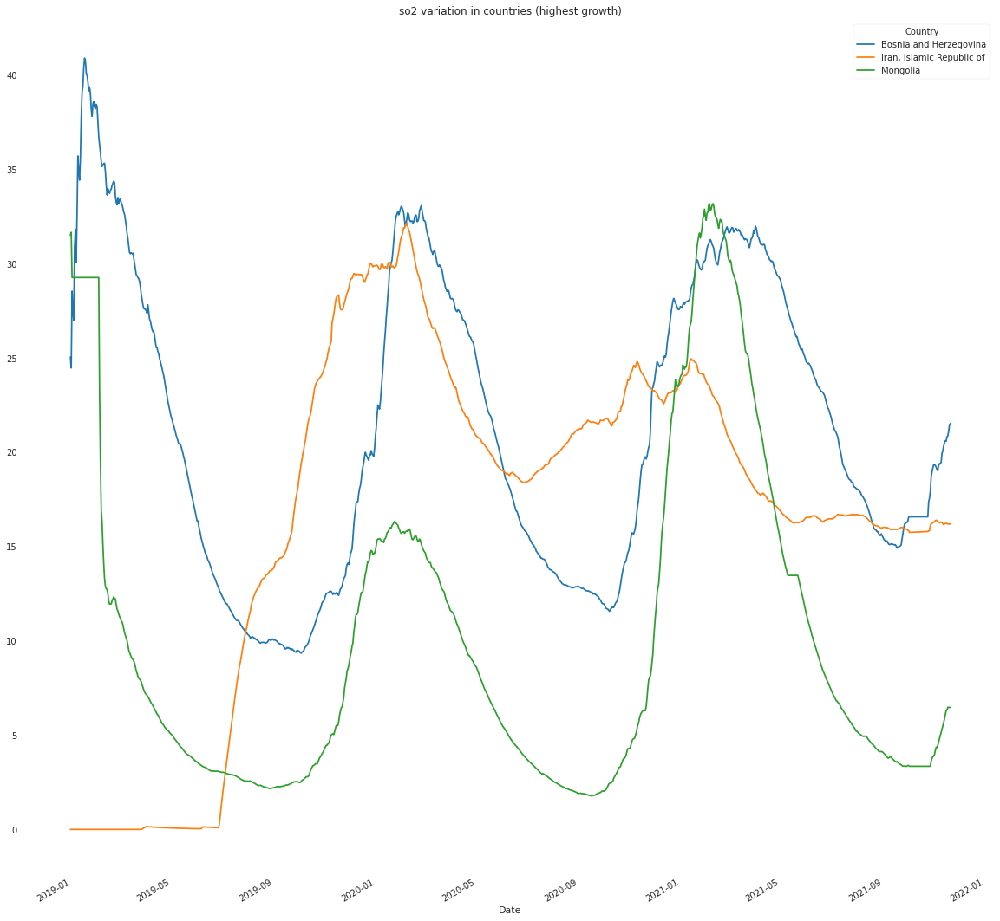

...

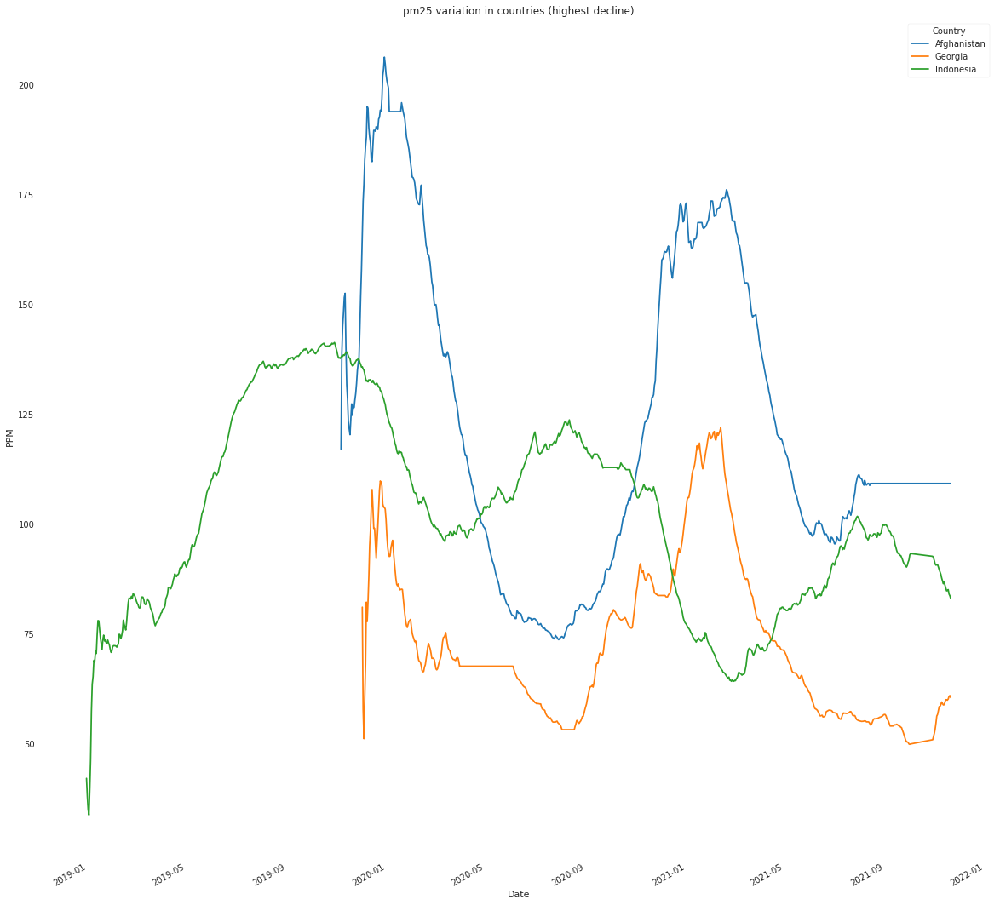

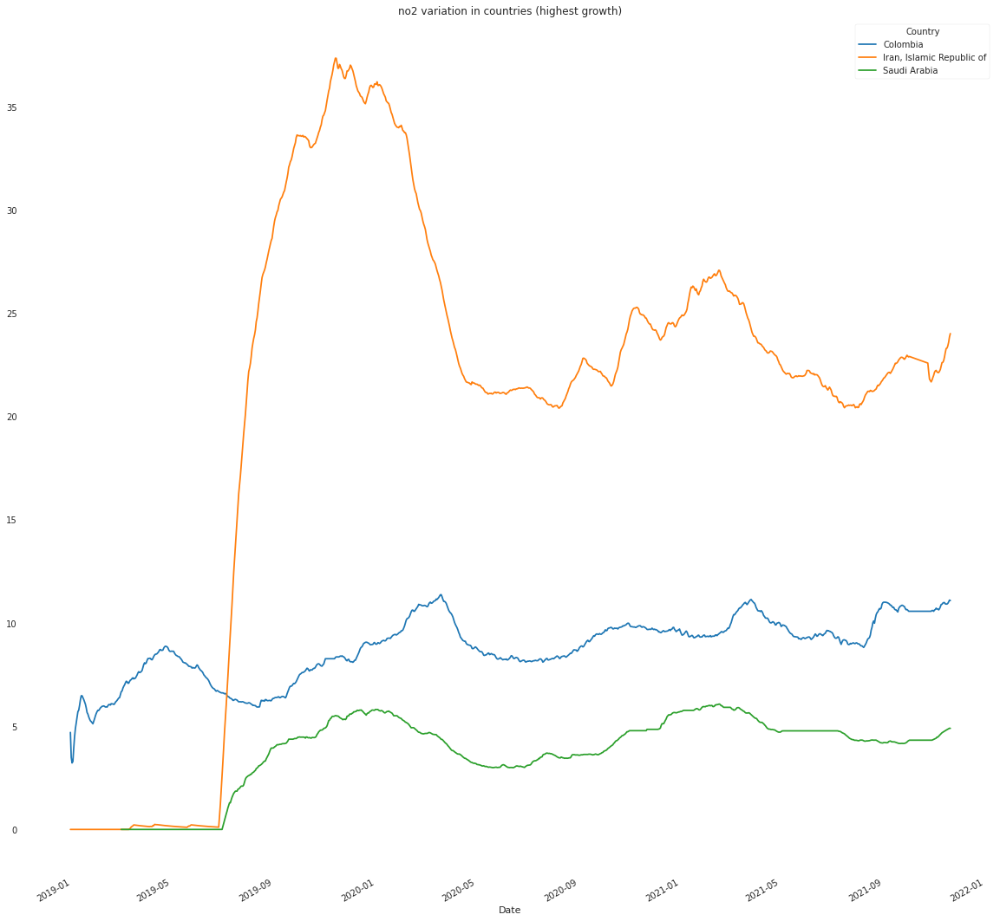

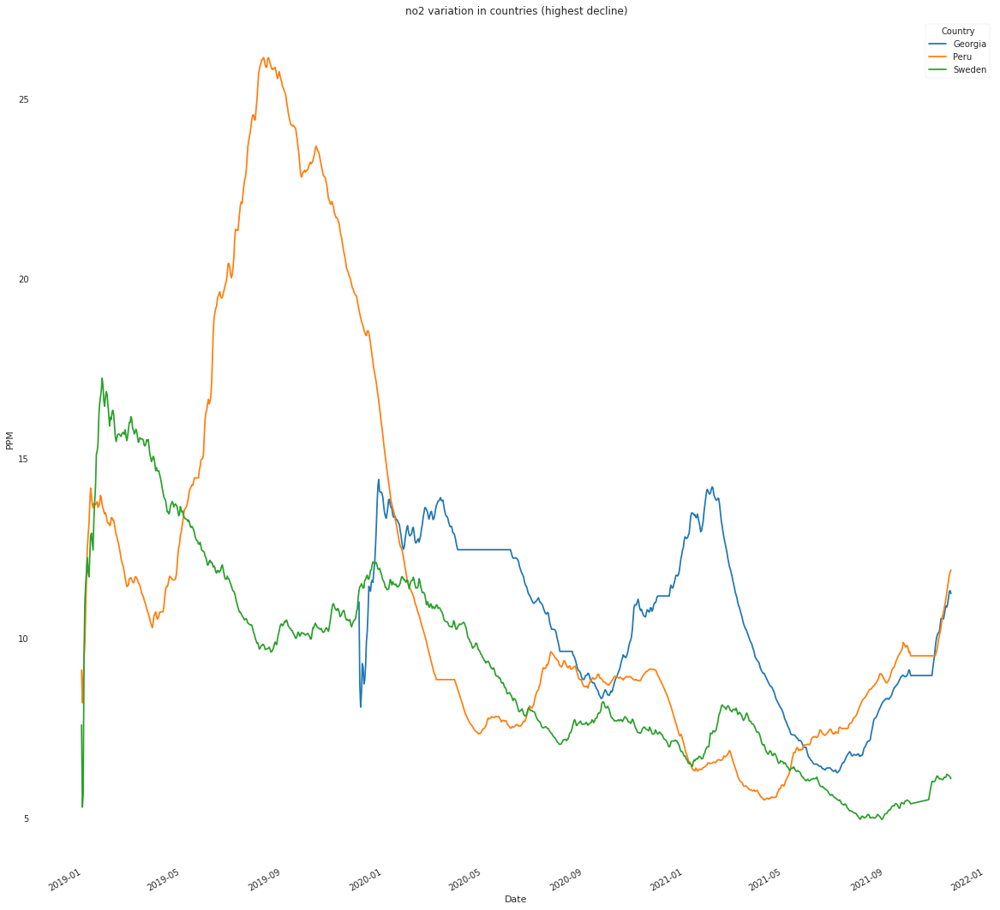

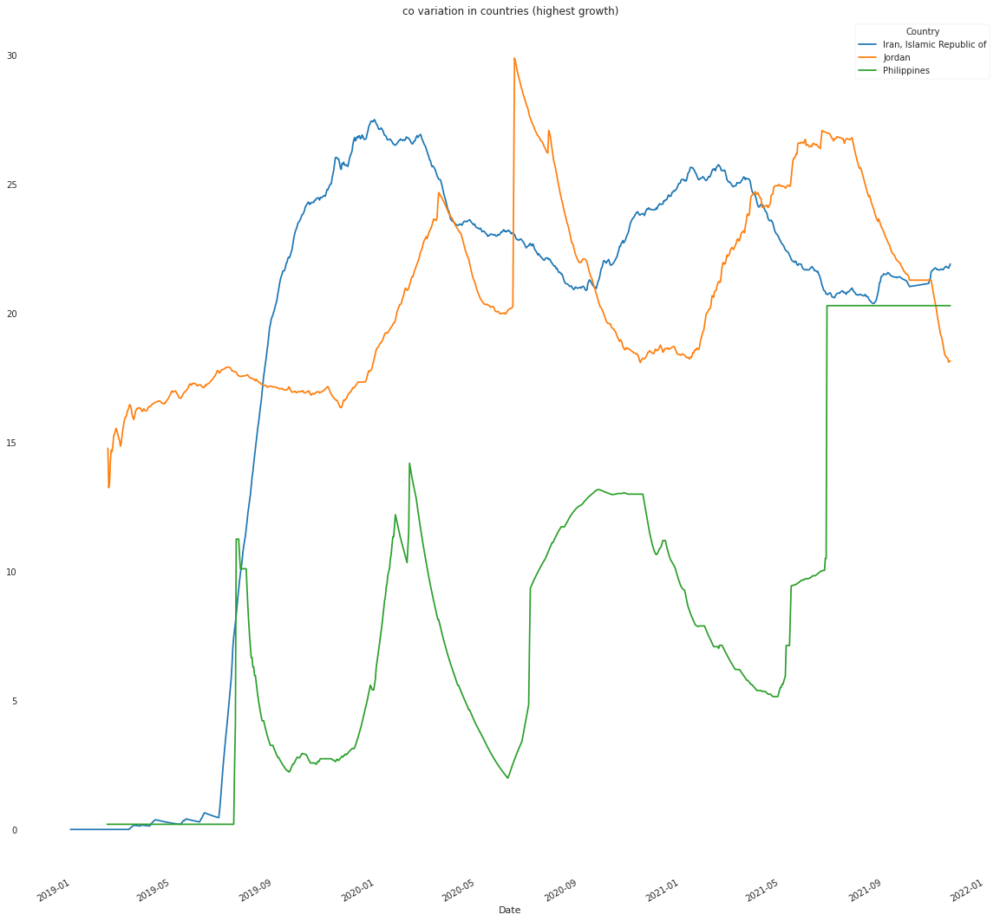

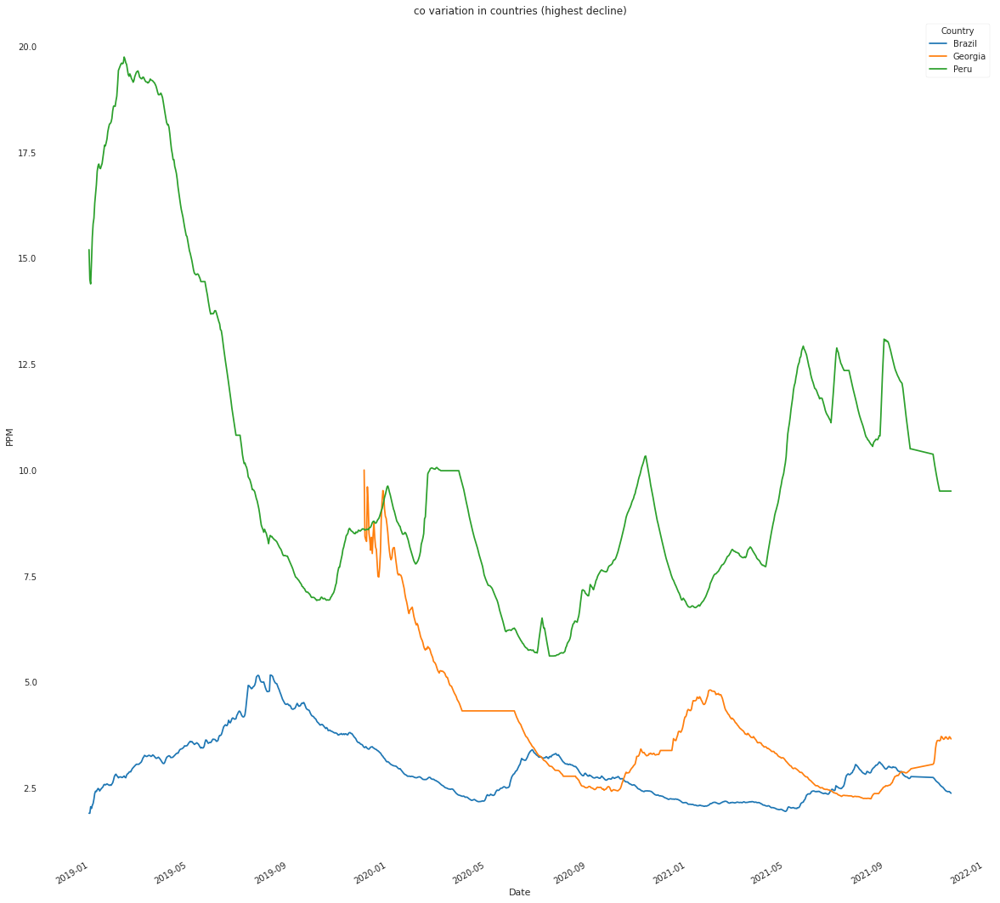

In [ ]:
for specie in species_of_interest:
  explore_regions(datasets, specie, 3, column = 'Country')
  

The cities with 3 largest increases in pm10 from 2019 to 2021 are ['Arāk', 'Qom', 'Kermanshah']
The cities with 3 smallest increases in pm10 from 2019 to 2021 are ['Novosibirsk', 'Canberra', 'Nakhon Pathom']
---------------------------------------------------------------------------------
The cities with 3 largest increases in o3 from 2019 to 2021 are ['Eskişehir', 'Netanya', 'Jerusalem']
The cities with 3 smallest increases in o3 from 2019 to 2021 are ['Aguascalientes', 'Istanbul', 'Wuxi']
---------------------------------------------------------------------------------
The cities with 3 largest increases in so2 from 2019 to 2021 are ['Balıkesir', 'Khorramabad', 'Orūmīyeh']
The cities with 3 smallest increases in so2 from 2019 to 2021 are ['East London', 'Lima', 'Košice']
---------------------------------------------------------------------------------
The cities with 3 largest increases in pm25 from 2019 to 2021 are ['Bandar Abbas', 'Shiraz', 'Qom']
The cities with 3 smallest increas

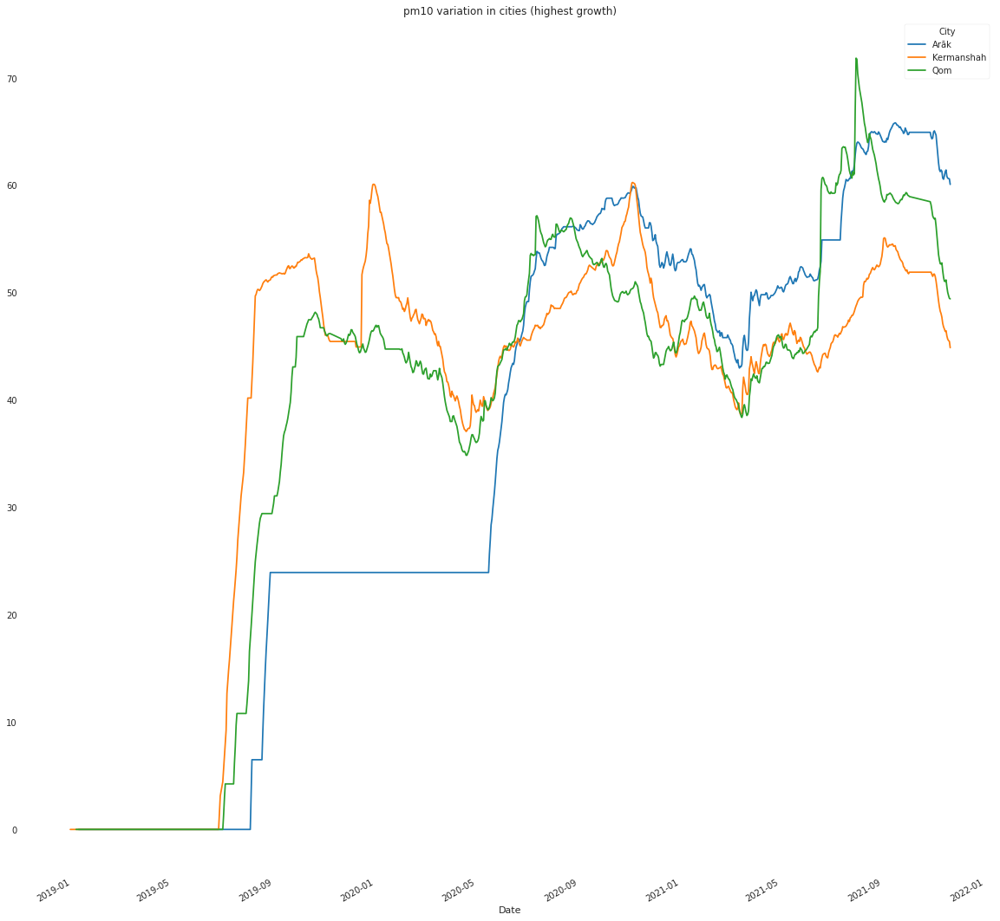

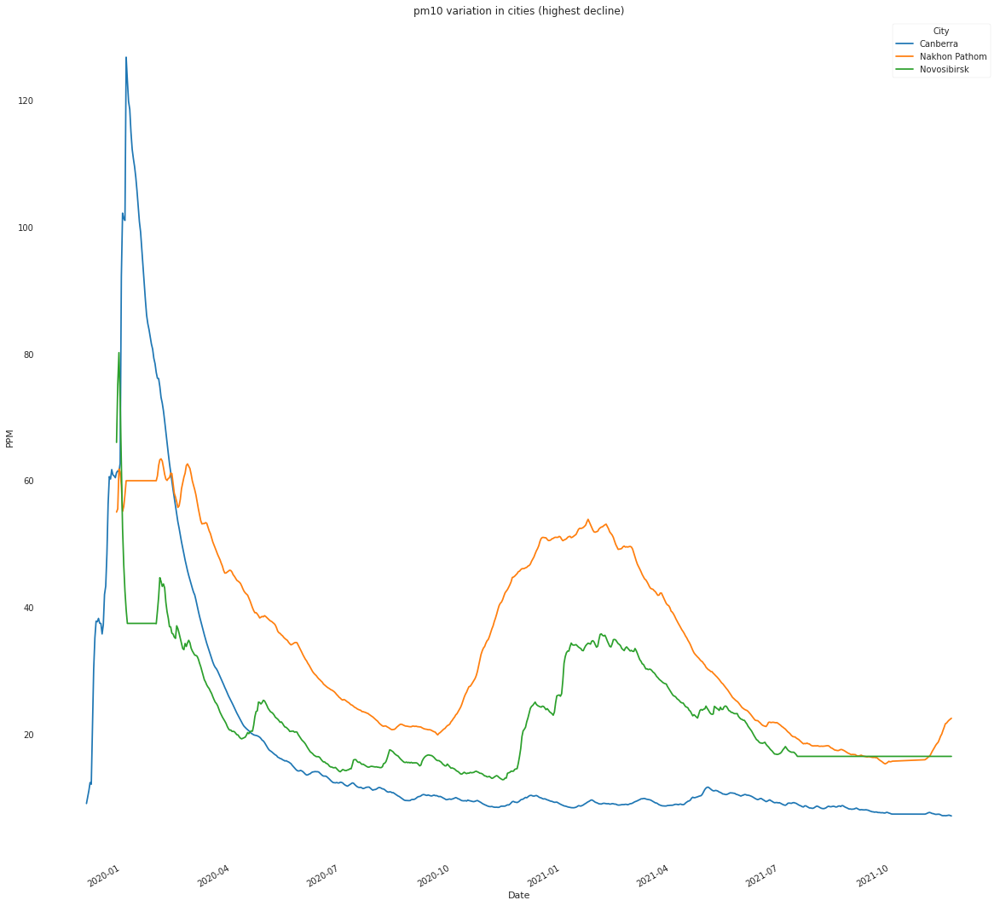

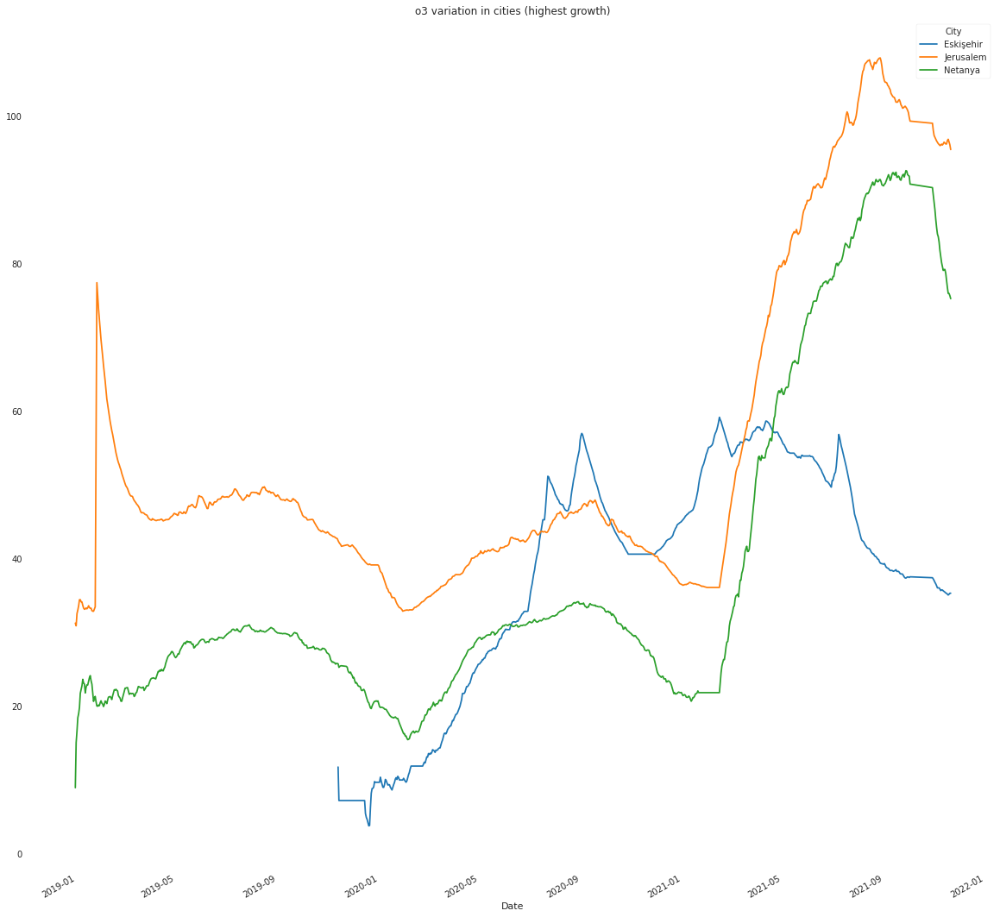

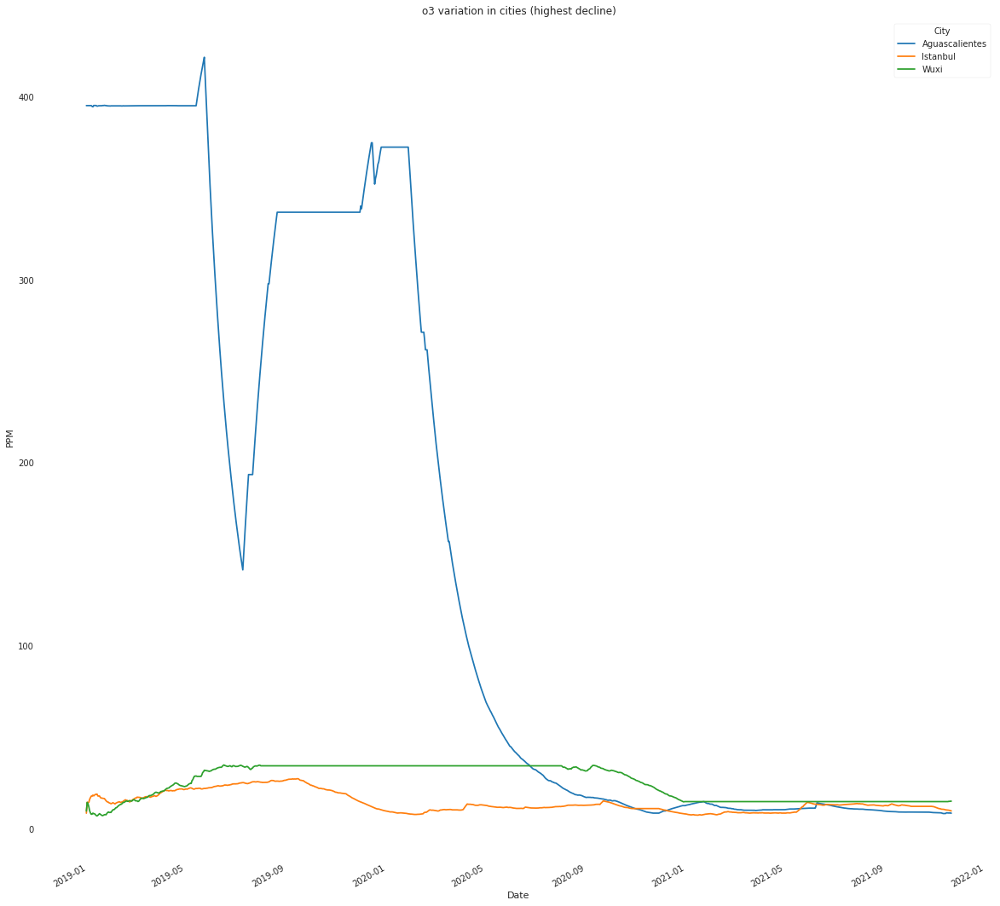

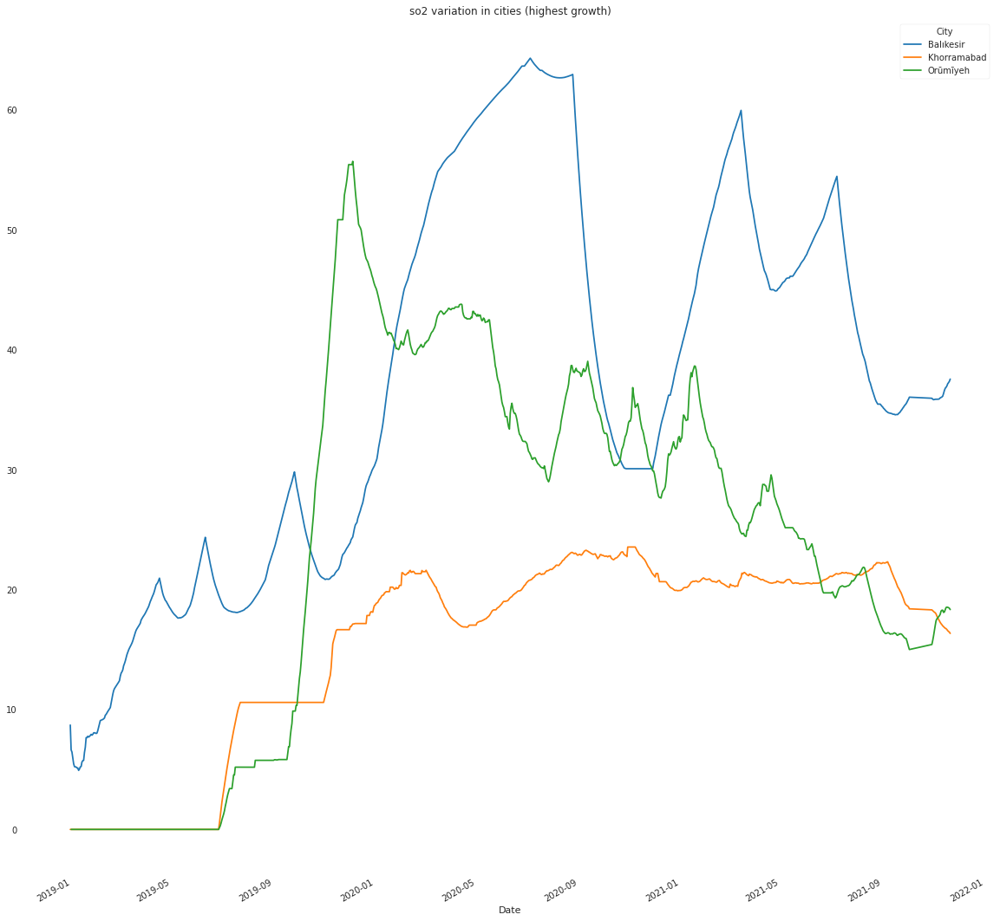

...

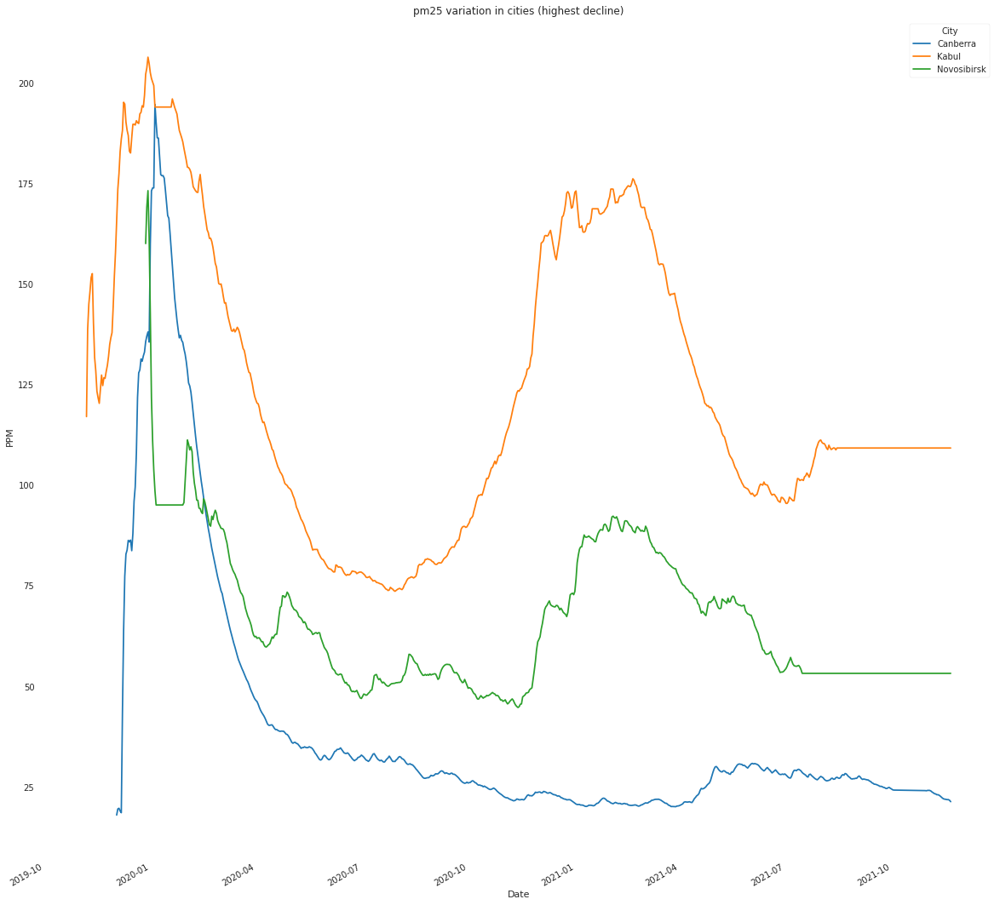

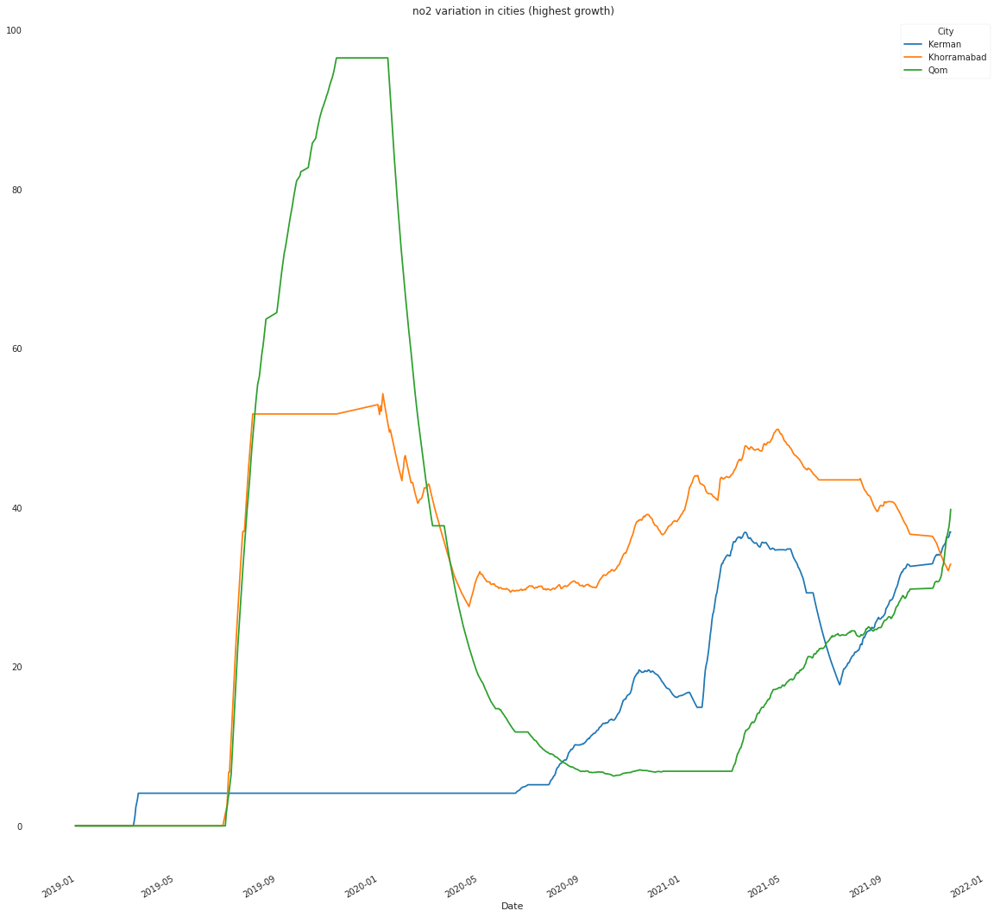

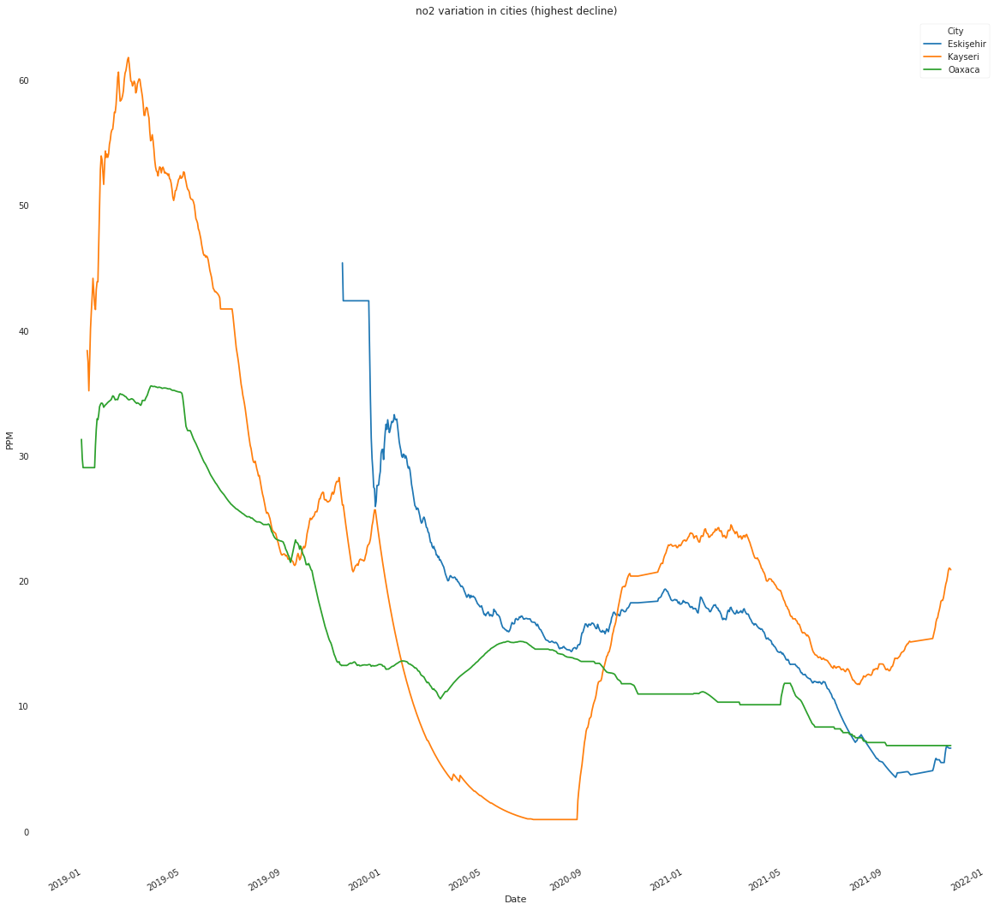

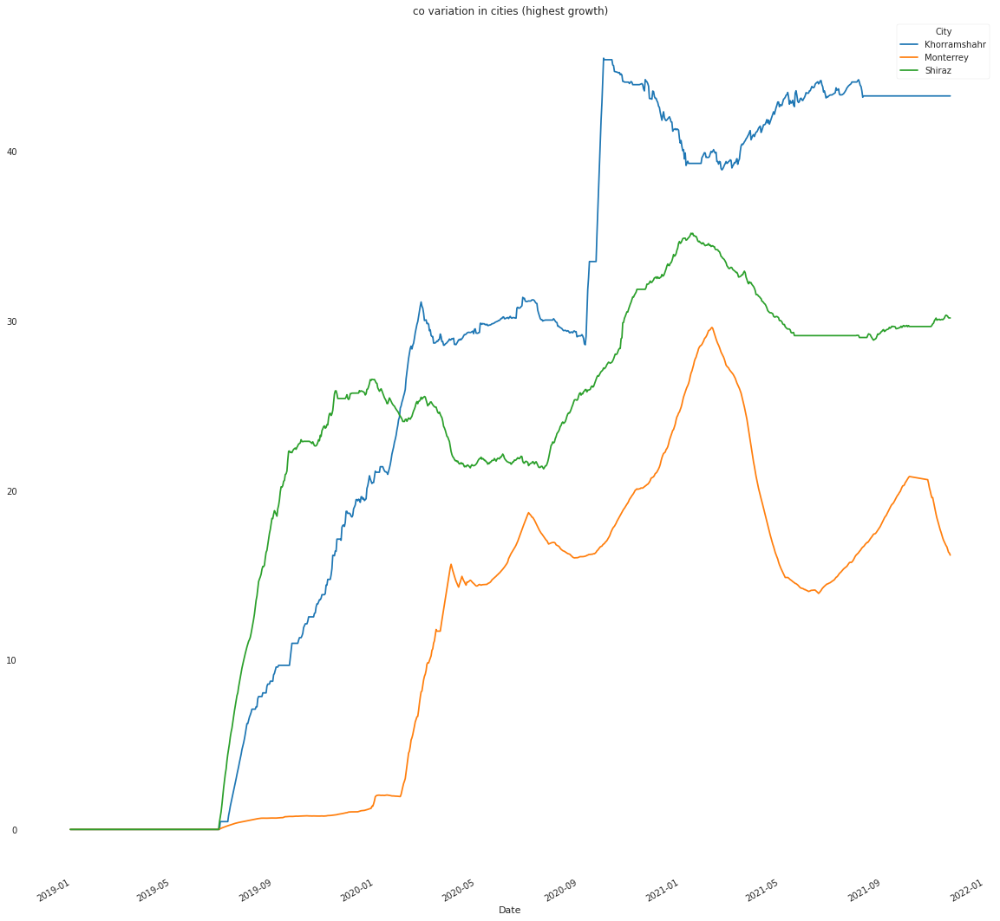

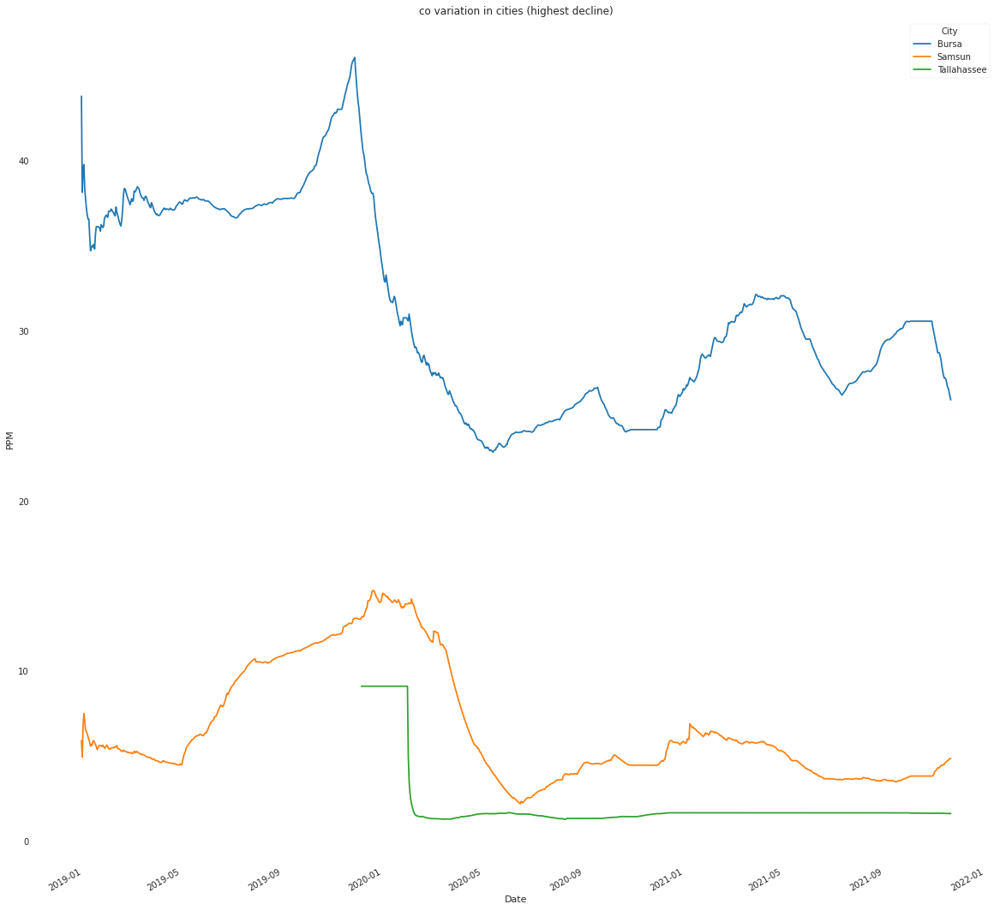

In [ ]:
for specie in species_of_interest:
  explore_regions(datasets, specie, 3, column = 'City')

# Dataset sources

Air-traffic Traffic Dataset(1990 - 2020): https://www.kaggle.com/parulpandey/us-international-air-traffic-data

Pollution: 
https://aqicn.org/data-platform/covid19/

Suicide US data: 
https://www.cdc.gov/nchs/nvss/vsrr/mortality-dashboard.htm#

Global Gaming: 
https://www.kaggle.com/rankirsh/evolution-of-top-games-on-twitch?select=Twitch_global_data.csv
